Cell 1: Setup Data And Config

In [1]:
from pathlib import Path
from PIL import Image
import shutil, os, json, subprocess

# Copy project code
CODE_SRC = Path("/kaggle/input/datasets/dmmehedihasanabid/icmla26-updated-code/icmla26_code")
CODE_DST = Path("/kaggle/working/icmla26_code")

if CODE_DST.exists():
    shutil.rmtree(CODE_DST)

shutil.copytree(CODE_SRC, CODE_DST)
os.chdir(CODE_DST)

subprocess.run("pip install -q -r requirements.txt", shell=True, check=True)
subprocess.run("python check_environment.py", shell=True, check=True)

# Prepare clean standardized dataset folders
PREP = Path("/kaggle/working/icmla_prepared")
if PREP.exists():
    shutil.rmtree(PREP)
PREP.mkdir(parents=True, exist_ok=True)

IMG_EXTS = {".jpg", ".jpeg", ".png", ".bmp", ".webp", ".tif", ".tiff"}

def safe_link_tree(src_dir, dst_dir, verify=False, prefix=""):
    src_dir = Path(src_dir)
    dst_dir = Path(dst_dir)
    dst_dir.mkdir(parents=True, exist_ok=True)

    copied = 0
    bad = 0

    for i, p in enumerate(sorted(src_dir.glob("*"))):
        if not p.is_file() or p.suffix.lower() not in IMG_EXTS:
            continue

        if verify:
            try:
                with Image.open(p) as img:
                    img.verify()
            except Exception:
                bad += 1
                continue

        safe_prefix = f"{prefix}_" if prefix else ""
        out = dst_dir / f"{safe_prefix}{i:06d}_{p.name}"

        os.symlink(p, out)
        copied += 1

    return copied, bad

# 1. PlantVillage source
PV_ROOT = Path("/kaggle/input/datasets/arjuntejaswi/plant-village/PlantVillage")

print("PlantVillage")
print("Early", safe_link_tree(PV_ROOT / "Potato___Early_blight", PREP / "plantvillage_potato/Early Blight", prefix="pv_early"))
print("Late", safe_link_tree(PV_ROOT / "Potato___Late_blight", PREP / "plantvillage_potato/Late Blight", prefix="pv_late"))
print("Healthy", safe_link_tree(PV_ROOT / "Potato___healthy", PREP / "plantvillage_potato/Healthy", prefix="pv_healthy"))

# 2. PLD Pakistan target
PLD_ROOT = Path("/kaggle/input/datasets/rizwan123456789/potato-disease-leaf-datasetpld/PLD_3_Classes_256")

print("PLD Pakistan")
for split in ["Training", "Validation", "Testing"]:
    print(split, "Early", safe_link_tree(PLD_ROOT / split / "Early_Blight", PREP / "pld_pakistan/Early Blight", verify=True, prefix=f"pld_{split}_early"))
    print(split, "Late", safe_link_tree(PLD_ROOT / split / "Late_Blight", PREP / "pld_pakistan/Late Blight", verify=True, prefix=f"pld_{split}_late"))
    print(split, "Healthy", safe_link_tree(PLD_ROOT / split / "Healthy", PREP / "pld_pakistan/Healthy", verify=True, prefix=f"pld_{split}_healthy"))

# 3. Irish target
IRISH_ROOT = Path("/kaggle/input/datasets/dmmehedihasanabid/irish-potato/Irish for Kaggle")

print("Irish")
for src_cls, dst_cls, pref in [
    ("Early blight", "Early Blight", "irish_early"),
    ("Late blight", "Late Blight", "irish_late"),
    ("Healthy", "Healthy", "irish_healthy")
]:
    copied, bad = safe_link_tree(IRISH_ROOT / src_cls, PREP / f"irish_potato/{dst_cls}", verify=True, prefix=pref)
    print(src_cls, "copied:", copied, "bad:", bad)

# 4. PlantDoc potato-only overlap
PLANTDOC_ROOT = Path("/kaggle/input/datasets/abdulhasibuddin/plant-doc-dataset/PlantDoc-Dataset")

print("PlantDoc potato overlap")
for split in ["train", "test"]:
    print(split, "Early", safe_link_tree(PLANTDOC_ROOT / split / "Potato leaf early blight", PREP / "plantdoc_potato_overlap/Early Blight", verify=True, prefix=f"plantdoc_{split}_early"))
    print(split, "Late", safe_link_tree(PLANTDOC_ROOT / split / "Potato leaf late blight", PREP / "plantdoc_potato_overlap/Late Blight", verify=True, prefix=f"plantdoc_{split}_late"))

# Canonical config
cfg = {
    "inherits": "configs/default_config.json",
    "output_dir": "/kaggle/working/paper_outputs",
    "datasets": {
        "source": {
            "name": "PlantVillage Potato",
            "domain": "laboratory",
            "path": "/kaggle/working/icmla_prepared/plantvillage_potato"
        },
        "targets": [
            {
                "name": "PLD Pakistan",
                "domain": "regional_field_cropped",
                "path": "/kaggle/working/icmla_prepared/pld_pakistan"
            },
            {
                "name": "Irish Potato Dataset",
                "domain": "field",
                "path": "/kaggle/working/icmla_prepared/irish_potato",
                "fixed_split_per_class": {
                    "train": 998,
                    "val": 200,
                    "test": 300,
                    "seed": 2026
                }
            },
            {
                "name": "PlantDoc Potato Overlap",
                "domain": "uncontrolled_field_partial_overlap",
                "path": "/kaggle/working/icmla_prepared/plantdoc_potato_overlap",
                "optional": True
            }
        ]
    }
}

Path("configs/kaggle_config.json").write_text(json.dumps(cfg, indent=2))

print("Setup complete.")
print(Path("configs/kaggle_config.json").read_text())

# Final count check
print("\nFinal prepared counts:")
for d in sorted(PREP.rglob("*")):
    if d.is_dir() and d.parent != PREP and len(list(d.glob("*"))) > 0:
        print(len(list(d.glob("*"))), d)

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 57.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.7 MB/s eta 0:00:00
Python: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]
OK required numpy: 2.0.2
OK required pandas: 2.3.3
OK required scipy: 1.16.3
OK required sklearn: 1.6.1
OK required PIL: 11.3.0
OK required matplotlib: 3.10.0
OK required seaborn: 0.13.2
OK required torch: 2.10.0+cu128
OK required torchvision: 0.25.0+cu128
OK optional cv2: 4.13.0
OK optional timm: 1.0.26
OK optional open_clip: 3.3.0
OK optional transformers: 5.0.0
OK optional umap: 0.5.12
PlantVillage
Early (1000, 0)
Late (1000, 0)
Healthy (152, 0)
PLD Pakistan
Training Early (1303, 0)
Training Late (1132, 0)
Training Healthy (816, 0)
Validation Early (163, 0)
Validation Late (151, 0)
Validation Healthy (102, 0)
Testing Early (162, 0)
Testing Late (141, 0)
Testing Healthy (102, 0)
Irish
Early blight copied: 1498 bad: 2
Late blight copied: 1500 bad: 0
Healthy copied: 1500 bad:

Cell 2: Run Stage 1

In [2]:
from pathlib import Path
import json, subprocess

STAGE_NAME = "stage1"
MODELS = ["light_cnn", "mobilenet_v2", "efficientnet_b0"]
BATCH_SIZE = 32
OUTPUT_DIR = f"/kaggle/working/paper_outputs_{STAGE_NAME}"

stage_cfg = {
    "inherits": "configs/kaggle_config.json",
    "output_dir": OUTPUT_DIR,
    "models": MODELS,
    "batch_size": BATCH_SIZE
}

Path(f"configs/{STAGE_NAME}_config.json").write_text(json.dumps(stage_cfg, indent=2))

subprocess.run(f"rm -rf {OUTPUT_DIR}", shell=True, check=False)

subprocess.run(
    f"python run_pipeline.py --config configs/{STAGE_NAME}_config.json --skip-foundation",
    shell=True,
    check=True
)

subprocess.run(
    f'zip -r /kaggle/working/{STAGE_NAME}_outputs.zip "{OUTPUT_DIR}" > /dev/null',
    shell=True,
    check=True
)

print(f"Download: /kaggle/working/{STAGE_NAME}_outputs.zip")

Using device: cuda
Class mapping:
  0: Early Blight
  1: Late Blight
  2: Healthy

PlantVillage Potato: 2152 images
  Early Blight: 1000
  Late Blight: 1000
  Healthy: 152

PLD Pakistan: 4072 images
  Early Blight: 1628
  Late Blight: 1424
  Healthy: 1020

Irish Potato Dataset: 4498 images
  Early Blight: 1498
  Late Blight: 1500
  Healthy: 1500

PlantDoc Potato Overlap: 222 images
  Early Blight: 117
  Late Blight: 105
  Healthy: 0

Training light_cnn


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
evidence light_cnn: 100%|██████████| 64/64 [00:05<00:00, 12.41it/s]
/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/kaggle/working/icmla26_code/src/pipeline.py:612: RuntimeWarning: invalid value encountered in cast
  arr[mask] = np.median(arr[~mask], axis=0)
/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.


Training mobilenet_v2
Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth


100%|██████████| 13.6M/13.6M [00:00<00:00, 170MB/s]
evidence mobilenet_v2: 100%|██████████| 64/64 [00:06<00:00, 10.22it/s]
/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/kaggle/working/icmla26_code/src/pipeline.py:612: RuntimeWarning: invalid value encountered in cast
  arr[mask] = np.median(arr[~mask], axis=0)
/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/kaggle/working/icmla26_code/src/pipeline.py:612: RuntimeWarning: invalid value encountered in cast
  arr[mask] = np.medi


Training efficientnet_b0
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 231MB/s]
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:2524: UserWarning: y_pred contains classes not in y_true
  warnings.warn("y_pred contains classes not in y_true")
evidence efficientnet_b0: 100%|██████████| 64/64 [00:06<00:00,  9.38it/s]
/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/kaggle/working/icmla26_code/src/pipeline.py:612: RuntimeWarning: invalid value encountered in cast
  arr[mask] = np.median(arr[~mask], axis=0)
/usr/local/lib/python3.12/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:130: Runti


Done. Outputs saved to /kaggle/working/paper_outputs_stage1
Download: /kaggle/working/stage1_outputs.zip


In [3]:
from pathlib import Path
from IPython.display import display, FileLink, HTML, Javascript, Markdown
import os, shutil

# Change this if your zip has a different name
ZIP_PATH = Path("/kaggle/working/stage1_outputs.zip")

if not ZIP_PATH.exists():
    raise FileNotFoundError(f"Zip not found: {ZIP_PATH}")

# Make sure file is in /kaggle/working and current notebook dir
os.chdir("/kaggle/working")

display(Markdown(f"""
# Download Ready

File:

`{ZIP_PATH}`

Size:

`{ZIP_PATH.stat().st_size / (1024**2):.2f} MB`

Try the link below. If auto-download is blocked, right-click the link and choose **Save link as**.
"""))

display(FileLink(ZIP_PATH.name))

display(HTML(f"""
<a id="manual_download_link" href="{ZIP_PATH.name}" download="{ZIP_PATH.name}"
   style="font-size:20px; font-weight:bold; color:white; background:#2563eb;
          padding:12px 18px; border-radius:8px; text-decoration:none; display:inline-block;">
Download {ZIP_PATH.name}
</a>
"""))

# Attempt auto-click. Browser may block this, but sometimes it works.
display(Javascript(f"""
setTimeout(() => {{
    const a = document.getElementById("manual_download_link");
    if (a) a.click();
}}, 1000);
"""))


# Download Ready

File:

`/kaggle/working/stage1_outputs.zip`

Size:

`2314.83 MB`

Try the link below. If auto-download is blocked, right-click the link and choose **Save link as**.


/kaggle/working/stage1_outputs.zip

<IPython.core.display.Javascript object>

# ICMLA Stage 1 Report

Output folder: `/kaggle/working/paper_outputs_stage1`

## Paper Summary

Main finding
The pipeline reports evidence and performance from observed outputs; no hypothesis is forced.

Best-performing model
          model             dataset         experiment  macro_f1  accuracy
efficientnet_b0 PlantVillage Potato source_domain_test       1.0       1.0

Most lesion-focused model
mobilenet_v2 (0.4170)

Most background-sensitive model
light_cnn (0.6394)

Most robust model under domain shift
mobilenet_v2 (0.7862)

Key statistical findings
                dataset         model_a      model_b   metric   paired_t      p_value
           PLD Pakistan       light_cnn mobilenet_v2 macro_f1 -15.803401 8.678647e-16
           PLD Pakistan efficientnet_b0    light_cnn macro_f1  14.256271 1.237752e-14
PlantDoc Potato Overlap efficientnet_b0 mobilenet_v2 macro_f1 -12.533083 3.129129e-13
   Irish Potato Dataset efficientnet_b0    light_cnn macro_f1  12.413598 3.960222e-13
   Irish Potato Dataset       light_cnn mobilenet_v2 macro_f1 -12.137548 6.865866e-13
PlantDoc Potato O

## All Results

Rows: 291 | Columns: 15


,model,experiment,dataset,dataset_role,shot,seed,accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,balanced_accuracy,ece,test_loss,status
0,light_cnn,source_domain_test,PlantVillage Potato,source,NaN,NaN,0.981439,0.976768,0.950323,0.962664,0.981254,0.950323,0.037325,0.069990,ok
1,light_cnn,zero_shot_transfer,PLD Pakistan,target,NaN,NaN,0.574233,0.593524,0.580157,0.564990,0.567655,0.580157,0.113836,1.205365,ok
2,light_cnn,zero_shot_transfer,Irish Potato Dataset,target,NaN,NaN,0.354444,0.701792,0.354444,0.218688,0.218688,0.354444,0.538493,2.469067,ok
3,light_cnn,zero_shot_transfer,PlantDoc Potato Overlap,target,NaN,NaN,0.511111,0.382796,0.331349,0.335093,0.510342,0.497024,0.354877,1.500356,ok
4,light_cnn,few_shot,PLD Pakistan,target,1,11.0,0.608589,0.624294,0.607541,0.601762,0.605067,0.607541,0.136142,1.362686,ok
5,light_cnn,few_shot,PLD Pakistan,target,1,23.0,0.563190,0.652455,0.565221,0.548262,0.542289,0.565221,0.157179,1.417695,ok
6,light_cnn,few_shot,PLD Pakistan,target,1,37.0,0.561963,0.585754,0.553307,0.540443,0.549521,0.553307,0.145110,1.249536,ok
7,light_cnn,few_shot,PLD Pakistan,target,1,41.0,0.611043,0.678889,0.586629,0.580852,0.595850,0.586629,0.138023,1.243899,ok
8,light_cnn,few_shot,PLD Pakistan,target,1,53.0,0.619632,0.637311,0.627944,0.615260,0.617750,0.627944,0.118697,1.238369,ok
9,light_cnn,few_shot,PLD Pakistan,target,3,11.0,0.604908,0.623458,0.601393,0.594032,0.601967,0.601393,0.160071,1.317432,ok


## Seed Results

Rows: 270 | Columns: 15


,model,experiment,dataset,dataset_role,shot,seed,accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,balanced_accuracy,ece,test_loss,status
0,light_cnn,few_shot,PLD Pakistan,target,1,11,0.608589,0.624294,0.607541,0.601762,0.605067,0.607541,0.136142,1.362686,ok
1,light_cnn,few_shot,PLD Pakistan,target,1,23,0.563190,0.652455,0.565221,0.548262,0.542289,0.565221,0.157179,1.417695,ok
2,light_cnn,few_shot,PLD Pakistan,target,1,37,0.561963,0.585754,0.553307,0.540443,0.549521,0.553307,0.145110,1.249536,ok
3,light_cnn,few_shot,PLD Pakistan,target,1,41,0.611043,0.678889,0.586629,0.580852,0.595850,0.586629,0.138023,1.243899,ok
4,light_cnn,few_shot,PLD Pakistan,target,1,53,0.619632,0.637311,0.627944,0.615260,0.617750,0.627944,0.118697,1.238369,ok
5,light_cnn,few_shot,PLD Pakistan,target,3,11,0.604908,0.623458,0.601393,0.594032,0.601967,0.601393,0.160071,1.317432,ok
6,light_cnn,few_shot,PLD Pakistan,target,3,23,0.558282,0.618181,0.576603,0.543931,0.539733,0.576603,0.136977,1.295065,ok
7,light_cnn,few_shot,PLD Pakistan,target,3,37,0.593865,0.647931,0.589459,0.581311,0.582656,0.589459,0.144192,1.330443,ok
8,light_cnn,few_shot,PLD Pakistan,target,3,41,0.521472,0.604431,0.548714,0.498518,0.487382,0.548714,0.203108,1.415489,ok
9,light_cnn,few_shot,PLD Pakistan,target,3,53,0.604908,0.683542,0.608082,0.591686,0.590899,0.608082,0.153696,1.543880,ok


## Dataset Summary

Rows: 12 | Columns: 4


,dataset,class,count,domain
0,PlantVillage Potato,Early Blight,1000,laboratory
1,PlantVillage Potato,Late Blight,1000,laboratory
2,PlantVillage Potato,Healthy,152,laboratory
3,PLD Pakistan,Early Blight,1628,regional_field_cropped
4,PLD Pakistan,Late Blight,1424,regional_field_cropped
5,PLD Pakistan,Healthy,1020,regional_field_cropped
6,Irish Potato Dataset,Early Blight,1498,field
7,Irish Potato Dataset,Late Blight,1500,field
8,Irish Potato Dataset,Healthy,1500,field
9,PlantDoc Potato Overlap,Early Blight,117,uncontrolled_field_partial_overlap


## Main Performance Table

Rows: 291 | Columns: 15


,model,experiment,dataset,dataset_role,shot,seed,accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,balanced_accuracy,ece,test_loss,status
0,light_cnn,source_domain_test,PlantVillage Potato,source,NaN,NaN,0.981439,0.976768,0.950323,0.962664,0.981254,0.950323,0.037325,0.069990,ok
1,light_cnn,zero_shot_transfer,PLD Pakistan,target,NaN,NaN,0.574233,0.593524,0.580157,0.564990,0.567655,0.580157,0.113836,1.205365,ok
2,light_cnn,zero_shot_transfer,Irish Potato Dataset,target,NaN,NaN,0.354444,0.701792,0.354444,0.218688,0.218688,0.354444,0.538493,2.469067,ok
3,light_cnn,zero_shot_transfer,PlantDoc Potato Overlap,target,NaN,NaN,0.511111,0.382796,0.331349,0.335093,0.510342,0.497024,0.354877,1.500356,ok
4,light_cnn,few_shot,PLD Pakistan,target,1,11.0,0.608589,0.624294,0.607541,0.601762,0.605067,0.607541,0.136142,1.362686,ok
5,light_cnn,few_shot,PLD Pakistan,target,1,23.0,0.563190,0.652455,0.565221,0.548262,0.542289,0.565221,0.157179,1.417695,ok
6,light_cnn,few_shot,PLD Pakistan,target,1,37.0,0.561963,0.585754,0.553307,0.540443,0.549521,0.553307,0.145110,1.249536,ok
7,light_cnn,few_shot,PLD Pakistan,target,1,41.0,0.611043,0.678889,0.586629,0.580852,0.595850,0.586629,0.138023,1.243899,ok
8,light_cnn,few_shot,PLD Pakistan,target,1,53.0,0.619632,0.637311,0.627944,0.615260,0.617750,0.627944,0.118697,1.238369,ok
9,light_cnn,few_shot,PLD Pakistan,target,3,11.0,0.604908,0.623458,0.601393,0.594032,0.601967,0.601393,0.160071,1.317432,ok


## Few-Shot Adaptation Table

Rows: 54 | Columns: 35


,model,dataset,shot,accuracy_mean,accuracy_std,accuracy_ci95_low,accuracy_ci95_high,macro_precision_mean,macro_precision_std,macro_precision_ci95_low,...,balanced_accuracy_ci95_low,balanced_accuracy_ci95_high,ece_mean,ece_std,ece_ci95_low,ece_ci95_high,test_loss_mean,test_loss_std,test_loss_ci95_low,test_loss_ci95_high
0,efficientnet_b0,Irish Potato Dataset,1,0.833111,0.070006,0.746187,0.920035,0.844743,0.062791,0.766779,...,0.746187,0.920035,0.076138,0.011928,0.061328,0.090949,0.498613,0.133497,0.332855,0.664371
1,efficientnet_b0,Irish Potato Dataset,3,0.898444,0.019013,0.874837,0.922052,0.901699,0.015132,0.882910,...,0.874837,0.922052,0.069282,0.017055,0.048105,0.090459,0.355464,0.063214,0.276973,0.433955
2,efficientnet_b0,Irish Potato Dataset,5,0.896222,0.021295,0.869782,0.922663,0.899551,0.019043,0.875906,...,0.869782,0.922663,0.073312,0.010580,0.060175,0.086449,0.362062,0.036562,0.316665,0.407460
3,efficientnet_b0,Irish Potato Dataset,10,0.919111,0.025860,0.887001,0.951221,0.921498,0.024551,0.891013,...,0.887001,0.951221,0.059773,0.019996,0.034945,0.084601,0.291766,0.071971,0.202402,0.381130
4,efficientnet_b0,Irish Potato Dataset,20,0.942000,0.009006,0.930817,0.953183,0.943898,0.007814,0.934197,...,0.930817,0.953183,0.035034,0.009065,0.023778,0.046289,0.228973,0.029308,0.192582,0.265365
5,efficientnet_b0,Irish Potato Dataset,50,0.958444,0.003897,0.953606,0.963283,0.959425,0.003729,0.954795,...,0.953606,0.963283,0.030090,0.017401,0.008485,0.051696,0.174517,0.030316,0.136874,0.212159
6,efficientnet_b0,PLD Pakistan,1,0.739632,0.067898,0.655325,0.823939,0.777817,0.039544,0.728716,...,0.694402,0.840629,0.075971,0.056443,0.005888,0.146054,0.653822,0.151727,0.465428,0.842216
7,efficientnet_b0,PLD Pakistan,3,0.891779,0.054978,0.823514,0.960044,0.894789,0.042031,0.842601,...,0.842228,0.959662,0.049153,0.013381,0.032538,0.065768,0.306368,0.117709,0.160213,0.452523
8,efficientnet_b0,PLD Pakistan,5,0.918773,0.014760,0.900446,0.937100,0.917915,0.012336,0.902598,...,0.911013,0.943335,0.031233,0.011853,0.016516,0.045951,0.234424,0.023453,0.205304,0.263545
9,efficientnet_b0,PLD Pakistan,10,0.959755,0.014267,0.942040,0.977469,0.958854,0.015512,0.939593,...,0.948726,0.978693,0.041976,0.008897,0.030929,0.053022,0.141272,0.024632,0.110688,0.171857


## Attribution Evidence Table

Rows: 192 | Columns: 10


,model,dataset,domain,path,class,lesion_focus_ratio,leaf_focus_ratio,background_focus_ratio,attention_entropy,attribution_concentration
0,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Late Blight,0.022597,0.129280,0.870720,0.947166,0.000040
1,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Early Blight,0.396583,0.800349,0.199651,0.979709,0.000028
2,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Early Blight,0.531223,0.735966,0.264034,0.976751,0.000029
3,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Late Blight,0.005561,0.083918,0.916082,0.942477,0.000041
4,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Early Blight,0.438000,0.452108,0.547892,0.986800,0.000025
5,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Late Blight,0.058247,0.154114,0.845886,0.956525,0.000036
6,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Late Blight,0.053258,0.053333,0.946667,0.961581,0.000032
7,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Late Blight,0.114342,0.160386,0.839614,0.957163,0.000036
8,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Early Blight,0.617290,0.618835,0.381165,0.979207,0.000027
9,light_cnn,PlantVillage Potato,laboratory,/kaggle/working/icmla_prepared/plantvillage_po...,Early Blight,0.720070,0.722322,0.277678,0.982473,0.000027


## Lesion Occlusion Table

Rows: 12 | Columns: 8


,model,dataset,condition,accuracy,macro_f1,accuracy_drop,confidence_drop,label_flip_rate
0,light_cnn,PlantVillage Potato,lesion_occlusion,0.651972,0.692109,0.329466,0.043490,0.329466
1,light_cnn,PLD Pakistan,lesion_occlusion,0.467485,0.448128,0.106748,-0.057356,0.170552
2,light_cnn,Irish Potato Dataset,lesion_occlusion,0.247778,0.210668,0.106667,-0.027046,0.316667
3,light_cnn,PlantDoc Potato Overlap,lesion_occlusion,0.444444,0.306500,0.066667,0.000021,0.133333
4,mobilenet_v2,PlantVillage Potato,lesion_occlusion,0.907193,0.919342,0.090487,0.139412,0.090487
5,mobilenet_v2,PLD Pakistan,lesion_occlusion,0.566871,0.556433,0.013497,0.118478,0.370552
6,mobilenet_v2,Irish Potato Dataset,lesion_occlusion,0.187778,0.142421,0.305556,0.176559,0.652222
7,mobilenet_v2,PlantDoc Potato Overlap,lesion_occlusion,0.555556,0.481567,0.044444,0.073272,0.088889
8,efficientnet_b0,PlantVillage Potato,lesion_occlusion,0.496520,0.473023,0.503480,0.260828,0.503480
9,efficientnet_b0,PLD Pakistan,lesion_occlusion,0.439264,0.399065,0.105521,0.072028,0.336196


## Background Perturbation Table

Rows: 84 | Columns: 8


,model,dataset,condition,accuracy,macro_f1,accuracy_drop,confidence_drop,label_flip_rate
0,light_cnn,PlantVillage Potato,background_blur,0.874710,0.694522,0.106729,0.055131,0.111369
1,light_cnn,PlantVillage Potato,background_replacement,0.879350,0.782606,0.102088,0.159042,0.122970
2,light_cnn,PlantVillage Potato,brightness_shift,0.962877,0.922855,0.018561,0.051196,0.032483
3,light_cnn,PlantVillage Potato,contrast_shift,0.974478,0.952558,0.006961,0.006383,0.025522
4,light_cnn,PlantVillage Potato,shadow_simulation,0.795824,0.551164,0.185615,0.055553,0.190255
5,light_cnn,PlantVillage Potato,gaussian_noise,0.890951,0.840616,0.090487,0.042392,0.113689
6,light_cnn,PlantVillage Potato,motion_blur,0.918794,0.766290,0.062645,0.041601,0.067285
7,light_cnn,PLD Pakistan,background_blur,0.558282,0.546890,0.015951,-0.003042,0.046626
8,light_cnn,PLD Pakistan,background_replacement,0.520245,0.503507,0.053988,0.051454,0.125153
9,light_cnn,PLD Pakistan,brightness_shift,0.536196,0.530233,0.038037,0.027011,0.117791


## Leaf / Background Only Table

Rows: 36 | Columns: 8


,model,dataset,condition,accuracy,macro_f1,accuracy_drop,confidence_drop,label_flip_rate
0,light_cnn,PlantVillage Potato,full,0.981439,0.962664,0.000000,0.000000,0.000000
1,light_cnn,PlantVillage Potato,leaf_only,0.879350,0.782606,0.102088,0.158399,0.122970
2,light_cnn,PlantVillage Potato,background_only,0.503480,0.269383,0.477958,0.041536,0.482599
3,light_cnn,PLD Pakistan,full,0.574233,0.564990,0.000000,0.000000,0.000000
4,light_cnn,PLD Pakistan,leaf_only,0.517791,0.500771,0.056442,0.050845,0.127607
5,light_cnn,PLD Pakistan,background_only,0.359509,0.193853,0.214724,-0.281977,0.490798
6,light_cnn,Irish Potato Dataset,full,0.354444,0.218688,0.000000,0.000000,0.000000
7,light_cnn,Irish Potato Dataset,leaf_only,0.353333,0.216003,0.001111,0.004578,0.003333
8,light_cnn,Irish Potato Dataset,background_only,0.331111,0.165832,0.023333,-0.090906,0.995556
9,light_cnn,PlantDoc Potato Overlap,full,0.511111,0.335093,0.000000,0.000000,0.000000


## Representation Geometry Table

Rows: 12 | Columns: 6


,model,dataset,domain,silhouette_score,intra_class_compactness,inter_class_distance
0,light_cnn,PlantVillage Potato,PlantVillage Potato,0.563248,0.712440,2.976579
1,light_cnn,PLD Pakistan,PLD Pakistan,0.020589,1.195335,0.937736
2,light_cnn,Irish Potato Dataset,Irish Potato Dataset,0.090967,1.193011,1.597923
3,light_cnn,PlantDoc Potato Overlap,PlantDoc Potato Overlap,0.005719,1.495947,0.680945
4,mobilenet_v2,PlantVillage Potato,PlantVillage Potato,0.787397,0.409493,3.517668
5,mobilenet_v2,PLD Pakistan,PLD Pakistan,0.255681,1.054812,2.111335
6,mobilenet_v2,Irish Potato Dataset,Irish Potato Dataset,0.247029,1.014402,1.874324
7,mobilenet_v2,PlantDoc Potato Overlap,PlantDoc Potato Overlap,0.046418,1.336773,1.044327
8,efficientnet_b0,PlantVillage Potato,PlantVillage Potato,0.765730,0.432376,3.552345
9,efficientnet_b0,PLD Pakistan,PLD Pakistan,0.235213,1.081411,2.072068


## Efficiency Table

Rows: 3 | Columns: 2


,model,parameters
0,light_cnn,390147
1,mobilenet_v2,2227715
2,efficientnet_b0,4011391


## Statistical Significance Table

Rows: 9 | Columns: 6


,dataset,model_a,model_b,metric,paired_t,p_value
0,Irish Potato Dataset,efficientnet_b0,light_cnn,macro_f1,12.413598,3.960222e-13
1,Irish Potato Dataset,efficientnet_b0,mobilenet_v2,macro_f1,0.100978,9.202628e-01
2,Irish Potato Dataset,light_cnn,mobilenet_v2,macro_f1,-12.137548,6.865866e-13
3,PLD Pakistan,efficientnet_b0,light_cnn,macro_f1,14.256271,1.237752e-14
4,PLD Pakistan,efficientnet_b0,mobilenet_v2,macro_f1,2.417089,2.216217e-02
5,PLD Pakistan,light_cnn,mobilenet_v2,macro_f1,-15.803401,8.678647e-16
6,PlantDoc Potato Overlap,efficientnet_b0,light_cnn,macro_f1,-0.623368,5.379150e-01
7,PlantDoc Potato Overlap,efficientnet_b0,mobilenet_v2,macro_f1,-12.533083,3.129129e-13
8,PlantDoc Potato Overlap,light_cnn,mobilenet_v2,macro_f1,-10.039570,6.033792e-11


## Class-wise Performance Table

Rows: 36 | Columns: 5


,file,class,precision,recall,f1
0,predictions_mobilenet_v2_pld_pakistan.csv,Early Blight,0.964286,0.165644,0.282723
1,predictions_mobilenet_v2_pld_pakistan.csv,Late Blight,0.634211,0.845614,0.724812
2,predictions_mobilenet_v2_pld_pakistan.csv,Healthy,0.469657,0.872549,0.610635
3,predictions_efficientnet_b0_plantdoc_potato_ov...,Early Blight,0.620690,0.750000,0.679245
4,predictions_efficientnet_b0_plantdoc_potato_ov...,Late Blight,0.750000,0.285714,0.413793
5,predictions_efficientnet_b0_plantdoc_potato_ov...,Healthy,0.000000,0.000000,0.000000
6,predictions_light_cnn_plantvillage_potato.csv,Early Blight,1.000000,0.985000,0.992443
7,predictions_light_cnn_plantvillage_potato.csv,Late Blight,0.966019,0.995000,0.980296
8,predictions_light_cnn_plantvillage_potato.csv,Healthy,0.964286,0.870968,0.915254
9,predictions_light_cnn_irish_potato_dataset.csv,Early Blight,0.338710,0.980000,0.503425


## DBSCAN Evidence Region Table

Rows: 192 | Columns: 8


,model,dataset,path,num_regions,largest_region_size,region_compactness,lesion_overlap,background_overlap
0,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,2,3998,0.520849,0.036269,0.843563
1,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,7,1601,0.658456,0.646871,0.097648
2,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,5,3036,0.549373,0.731168,0.170586
3,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,4,3113,0.459662,0.009566,0.930251
4,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,7,1918,0.663552,0.690116,0.304902
5,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,5,2879,0.567392,0.012156,0.987644
6,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,4,4049,0.566158,0.007772,0.992228
7,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,4,3512,0.607499,0.026903,0.969908
8,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,8,2767,0.620906,0.701076,0.298127
9,light_cnn,PlantVillage Potato,/kaggle/working/icmla_prepared/plantvillage_po...,7,1963,0.690599,0.828218,0.171782


## Figures

Found 37 PNG figures.


### accuracy_macro_f1_curves.png

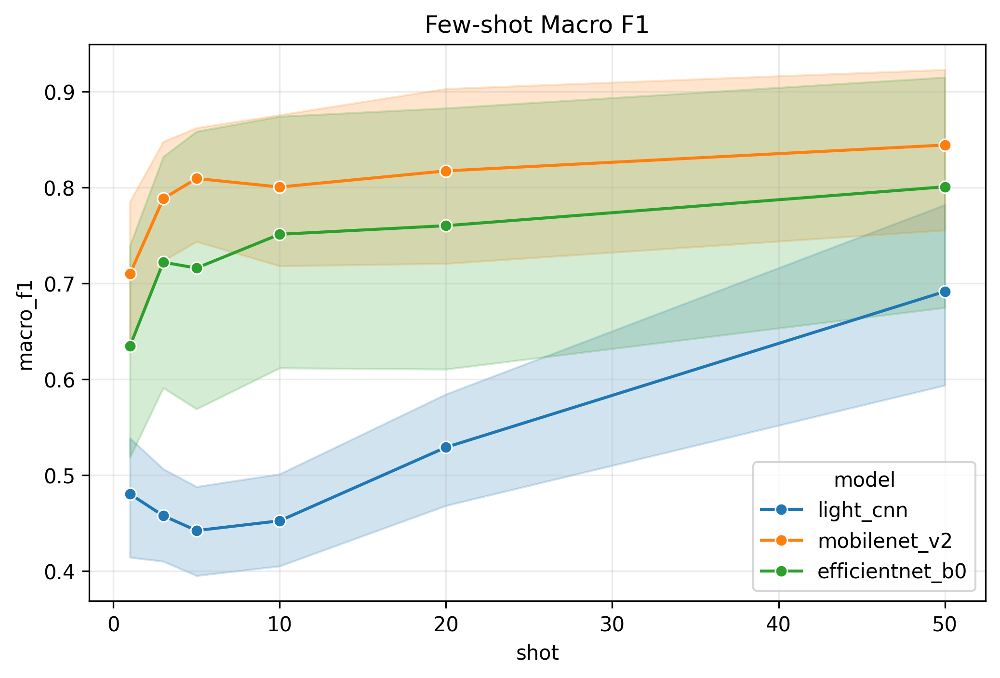

### attention_entropy.png

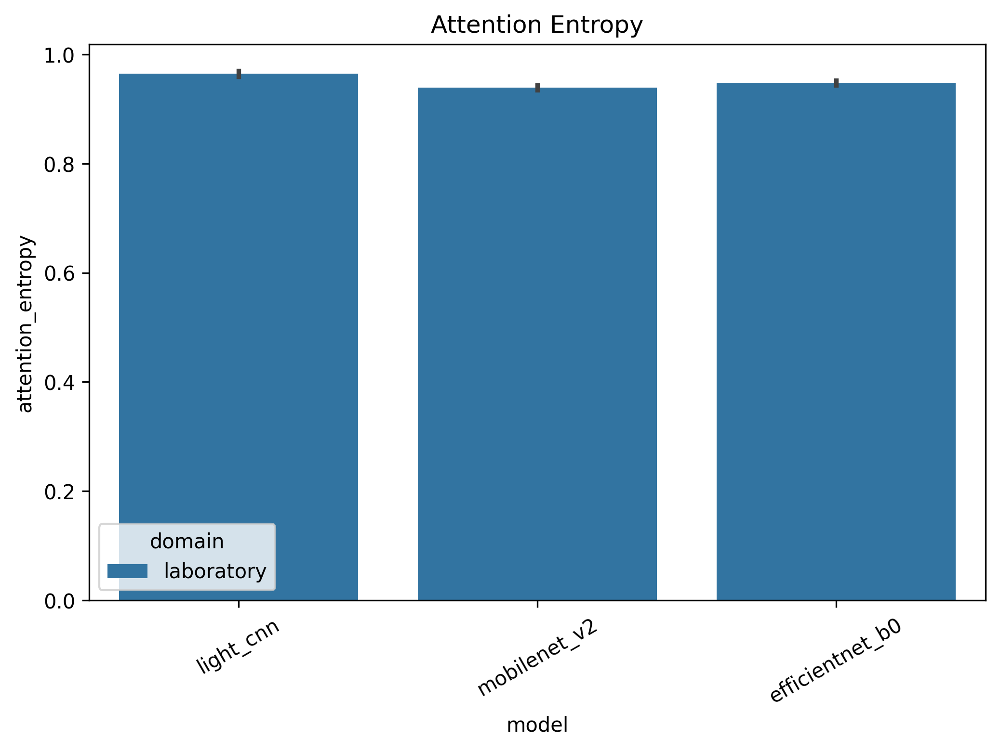

### attribution_maps_across_model_families.png

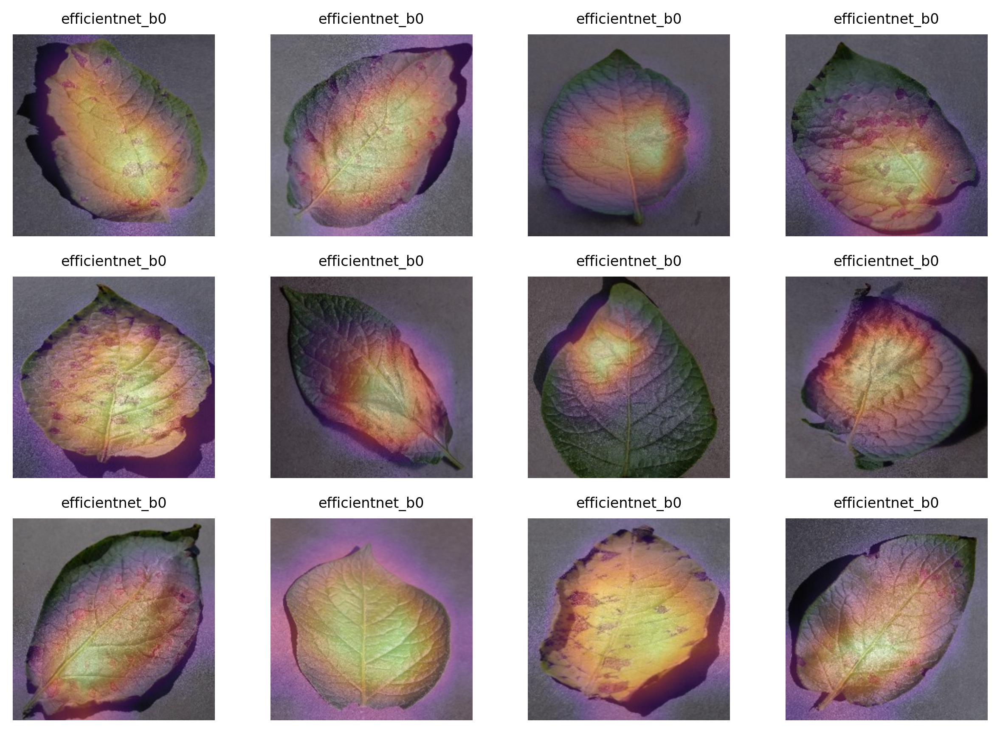

### background_focus_ratio.png

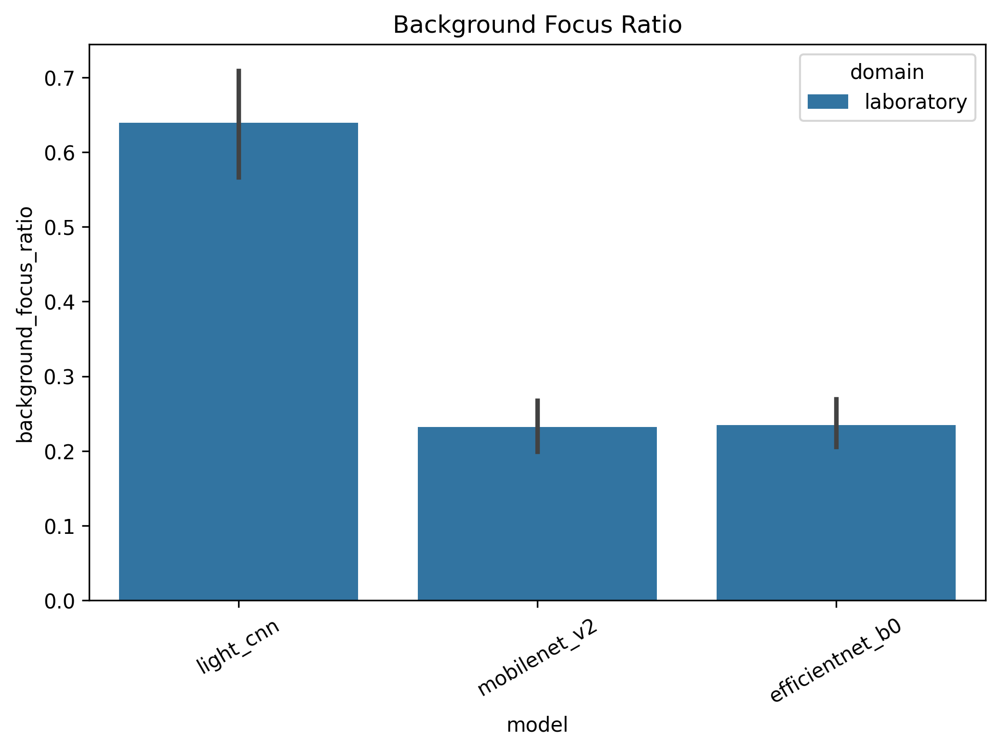

### background_perturbation_results.png

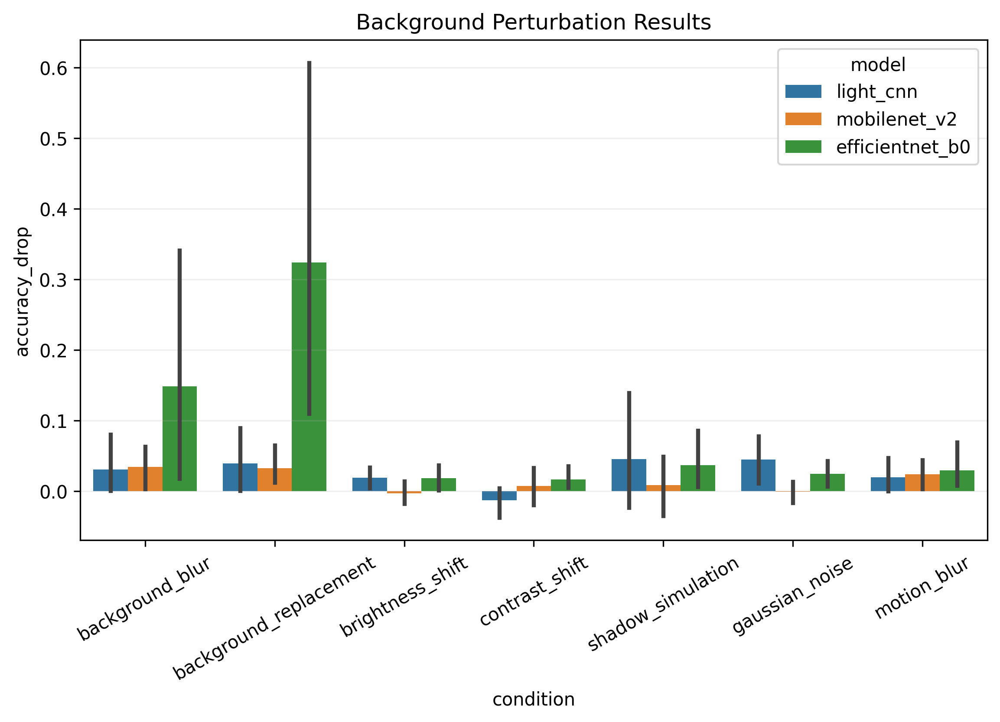

### calibration_reliability_efficientnet_b0_irish_potato_dataset.png

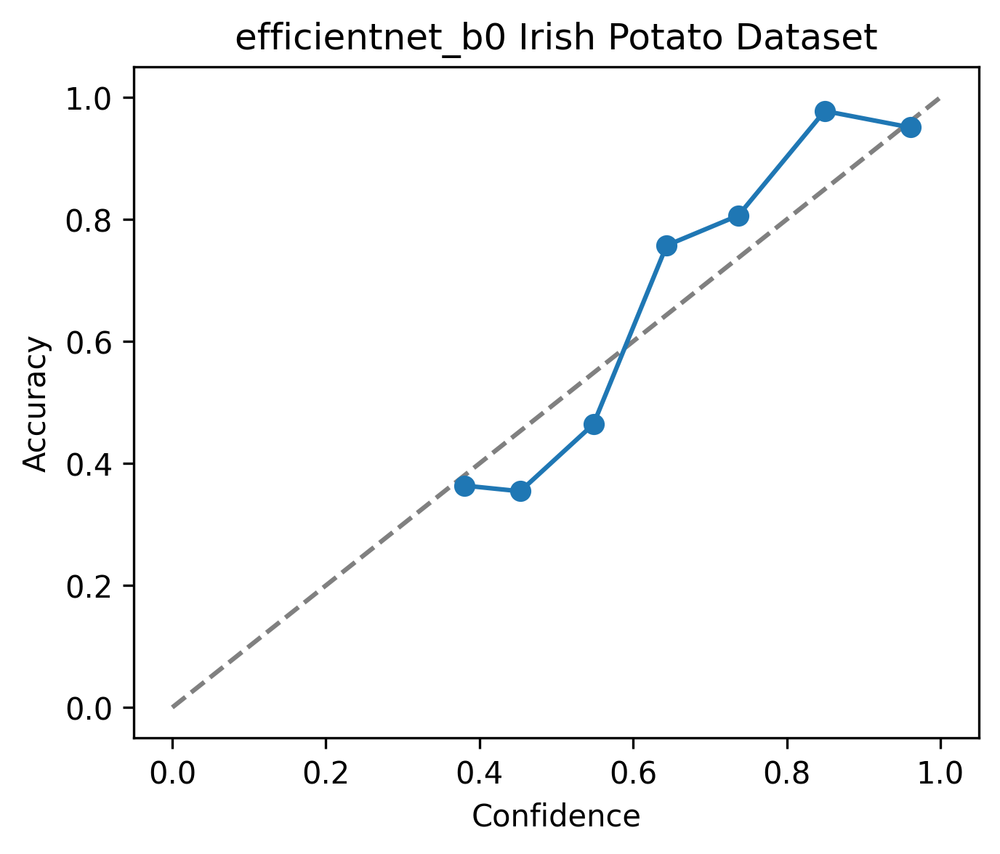

### calibration_reliability_efficientnet_b0_plantdoc_potato_overlap.png

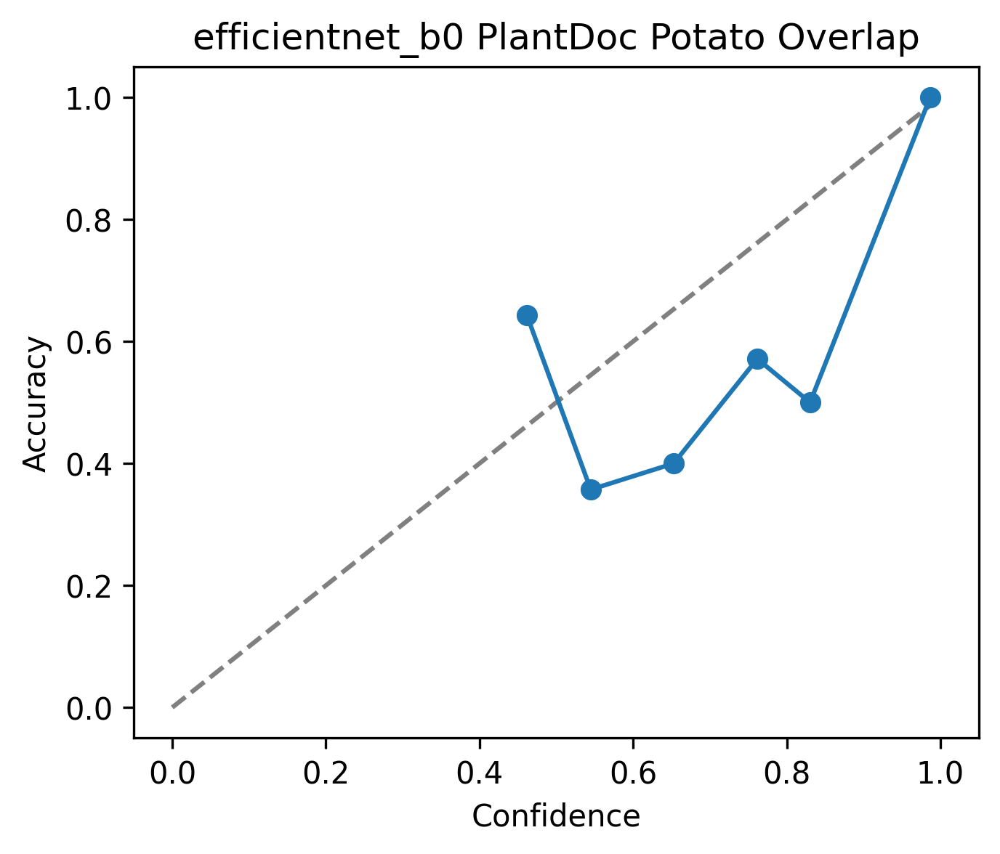

### calibration_reliability_efficientnet_b0_plantvillage_potato.png

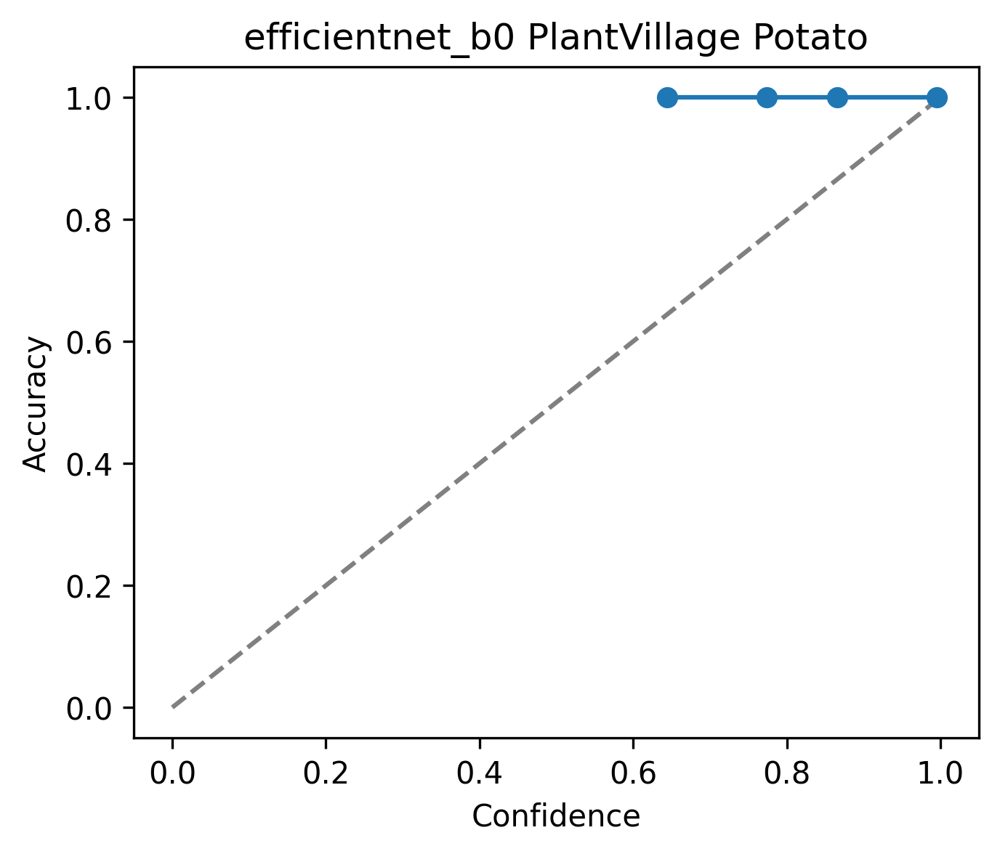

### calibration_reliability_efficientnet_b0_pld_pakistan.png

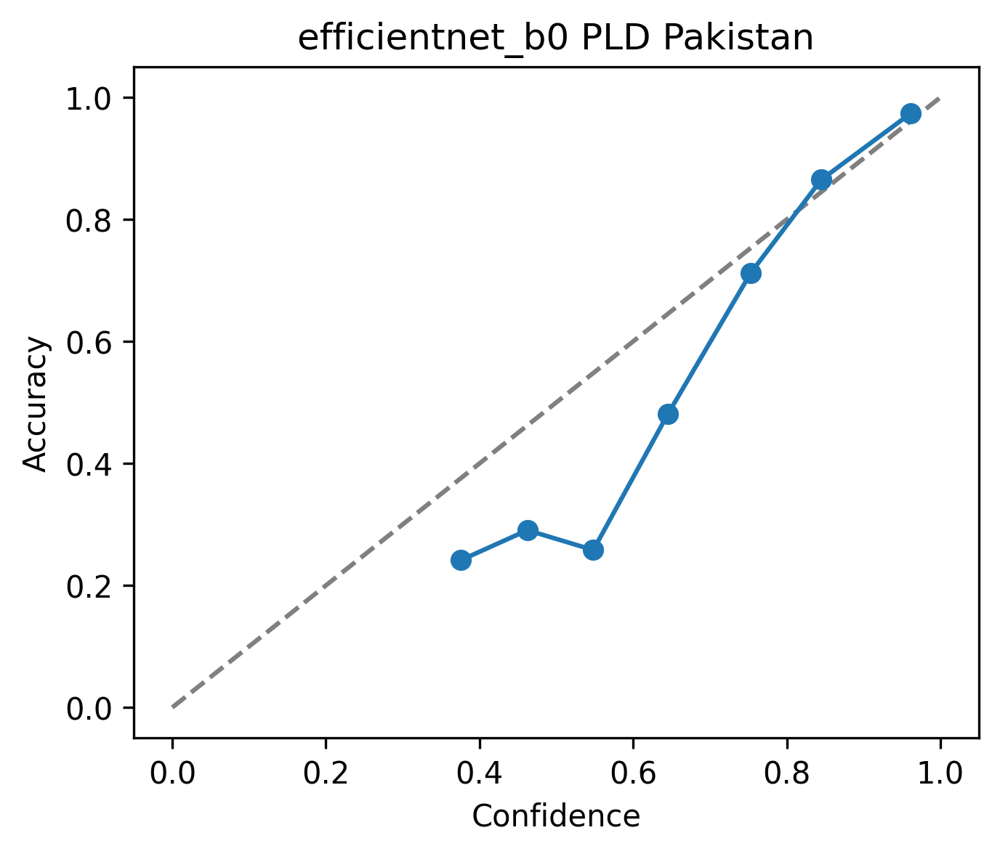

### calibration_reliability_light_cnn_irish_potato_dataset.png

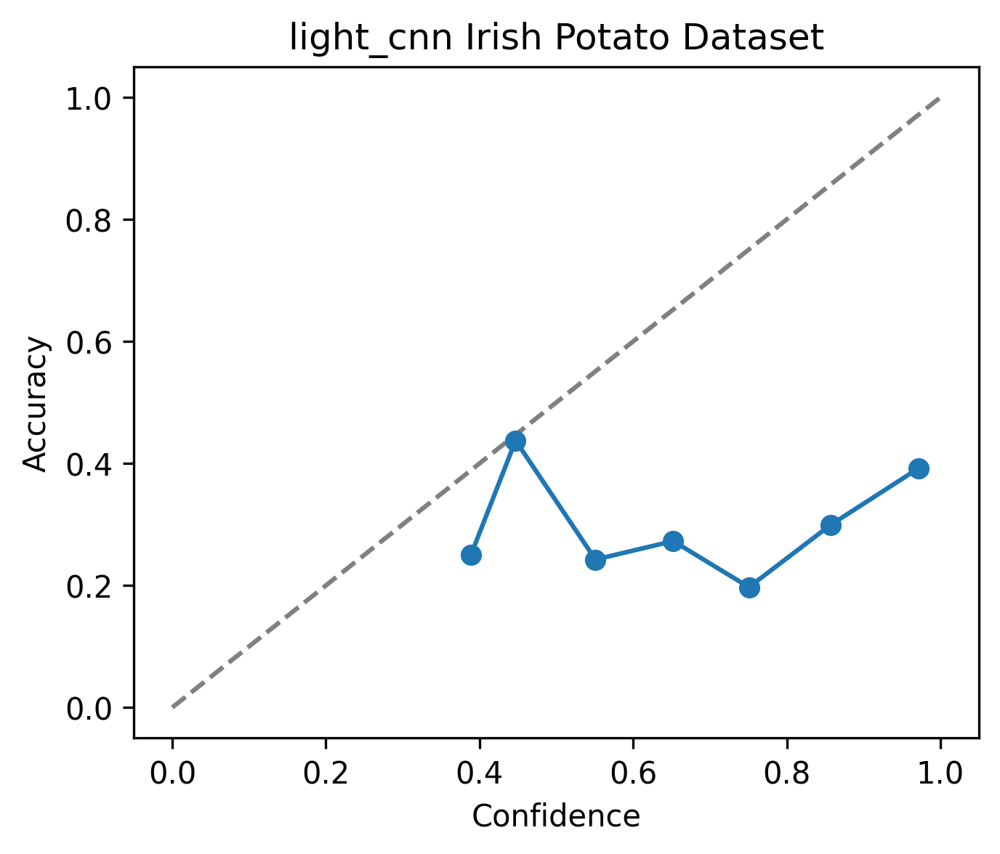

### calibration_reliability_light_cnn_plantdoc_potato_overlap.png

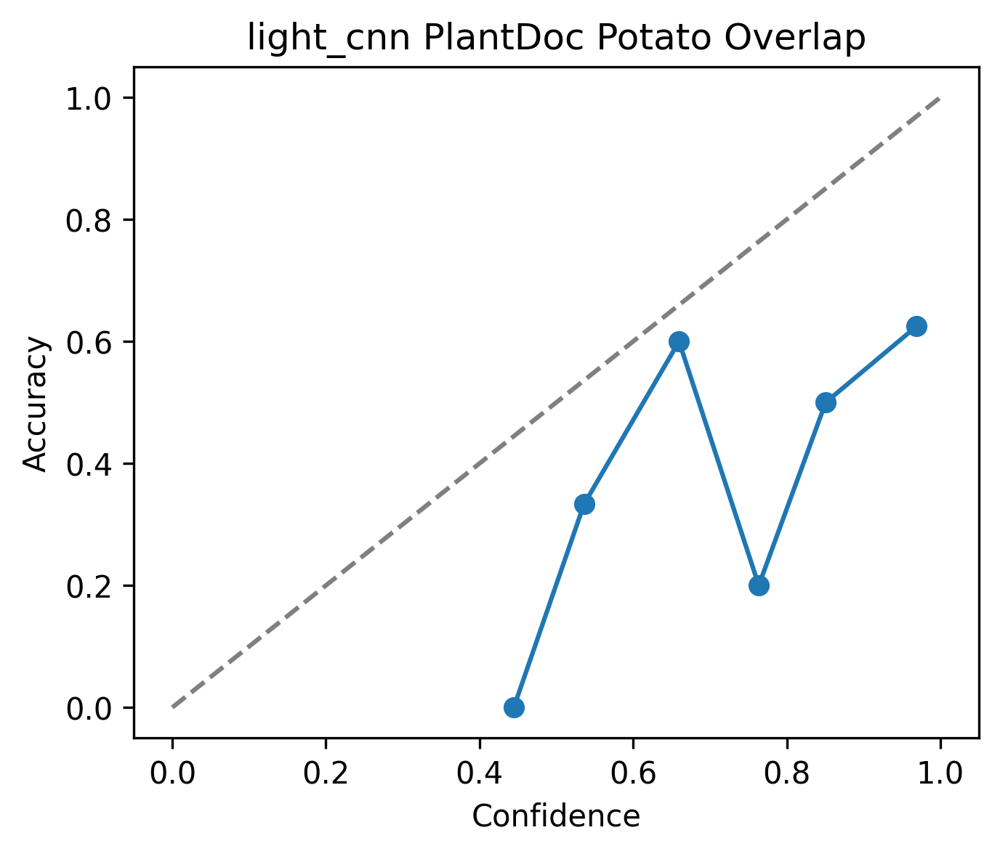

### calibration_reliability_light_cnn_plantvillage_potato.png

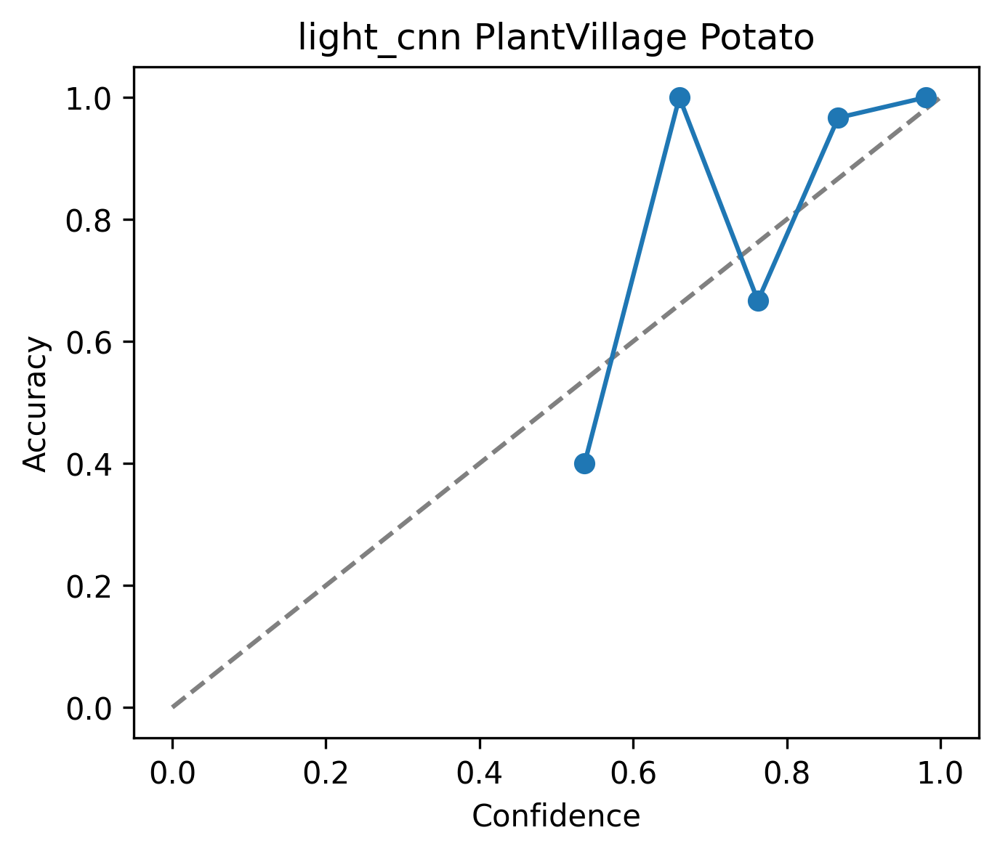

### calibration_reliability_light_cnn_pld_pakistan.png

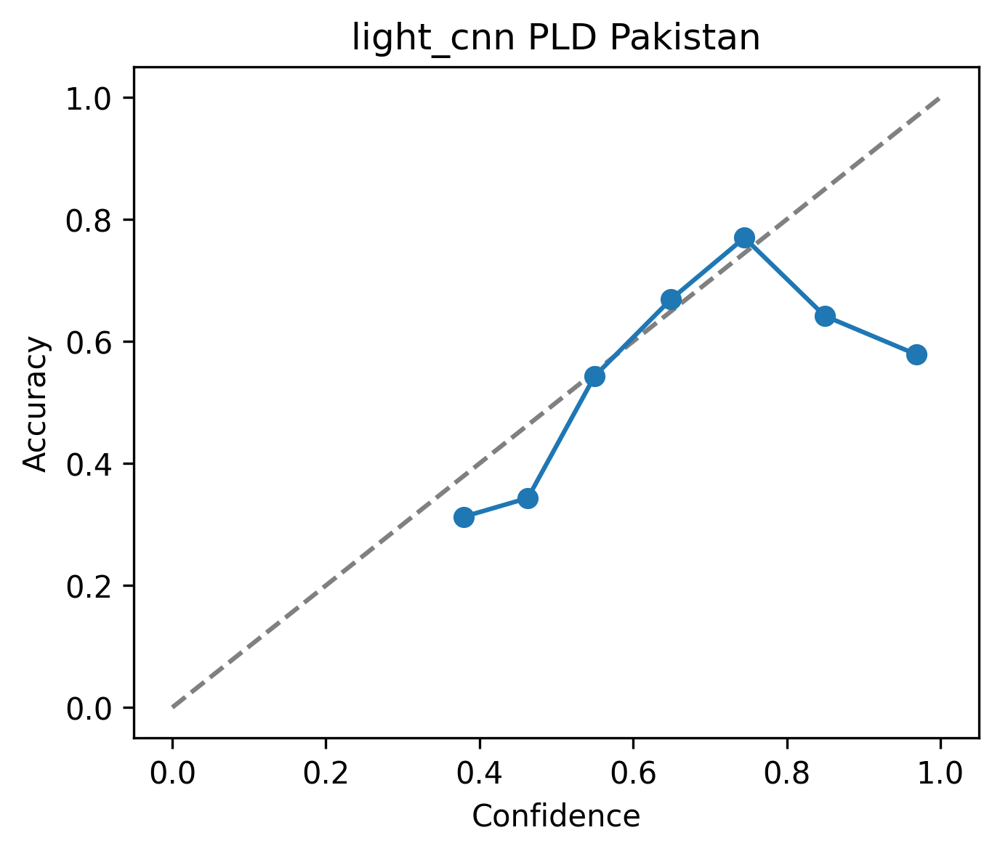

### calibration_reliability_mobilenet_v2_irish_potato_dataset.png

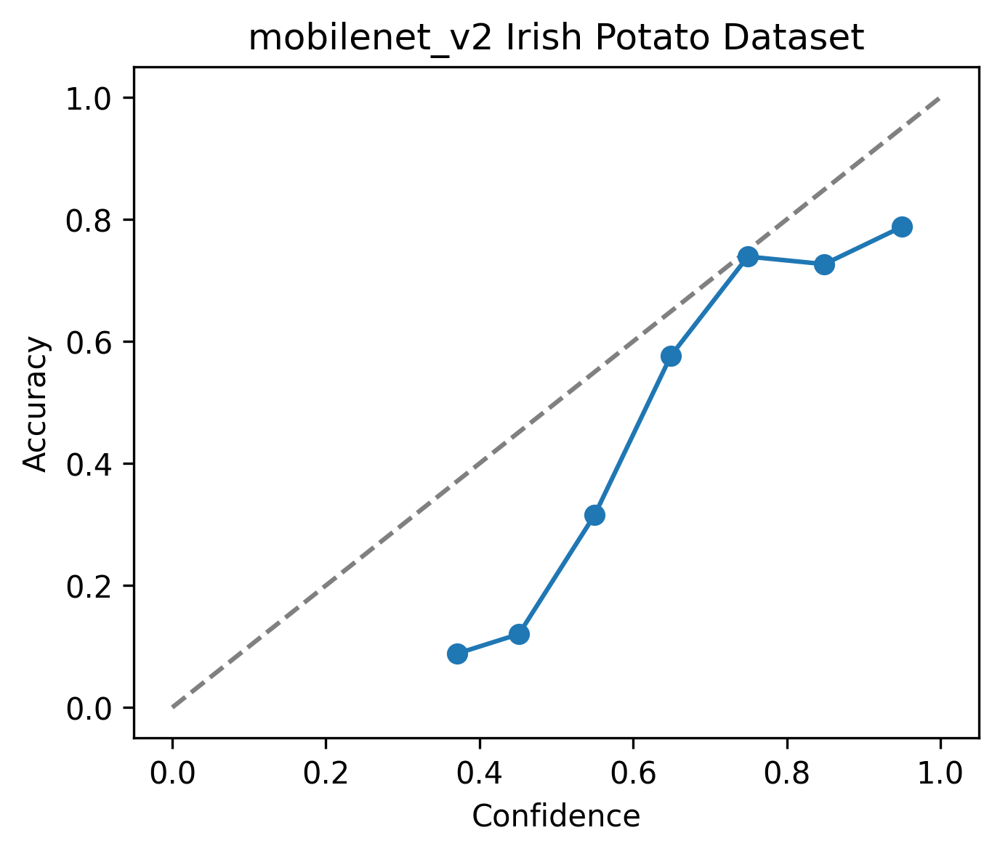

### calibration_reliability_mobilenet_v2_plantdoc_potato_overlap.png

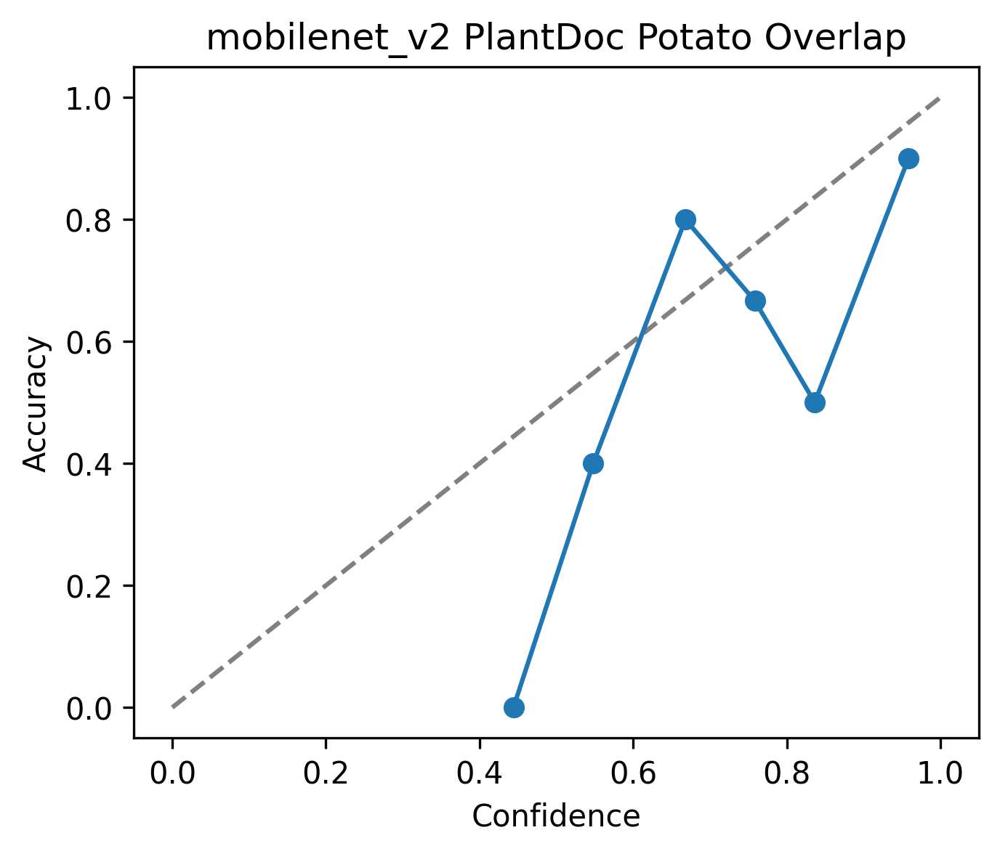

### calibration_reliability_mobilenet_v2_plantvillage_potato.png

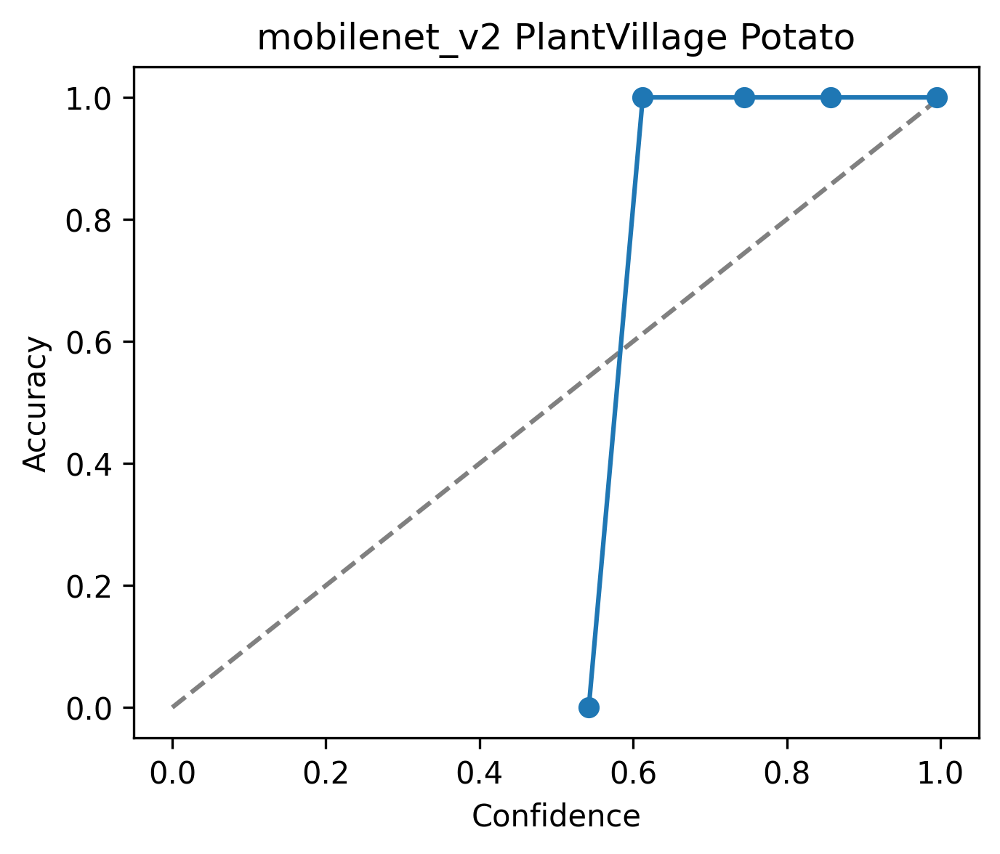

### calibration_reliability_mobilenet_v2_pld_pakistan.png

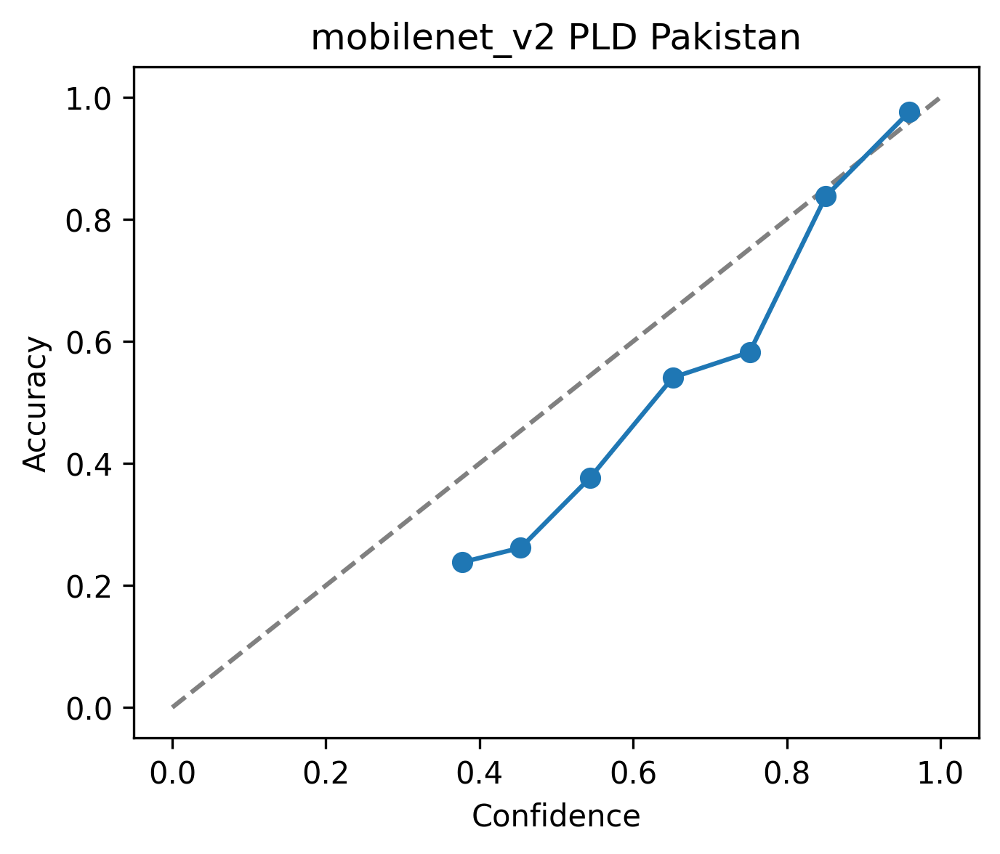

### confusion_matrix_efficientnet_b0_irish_potato_dataset.png

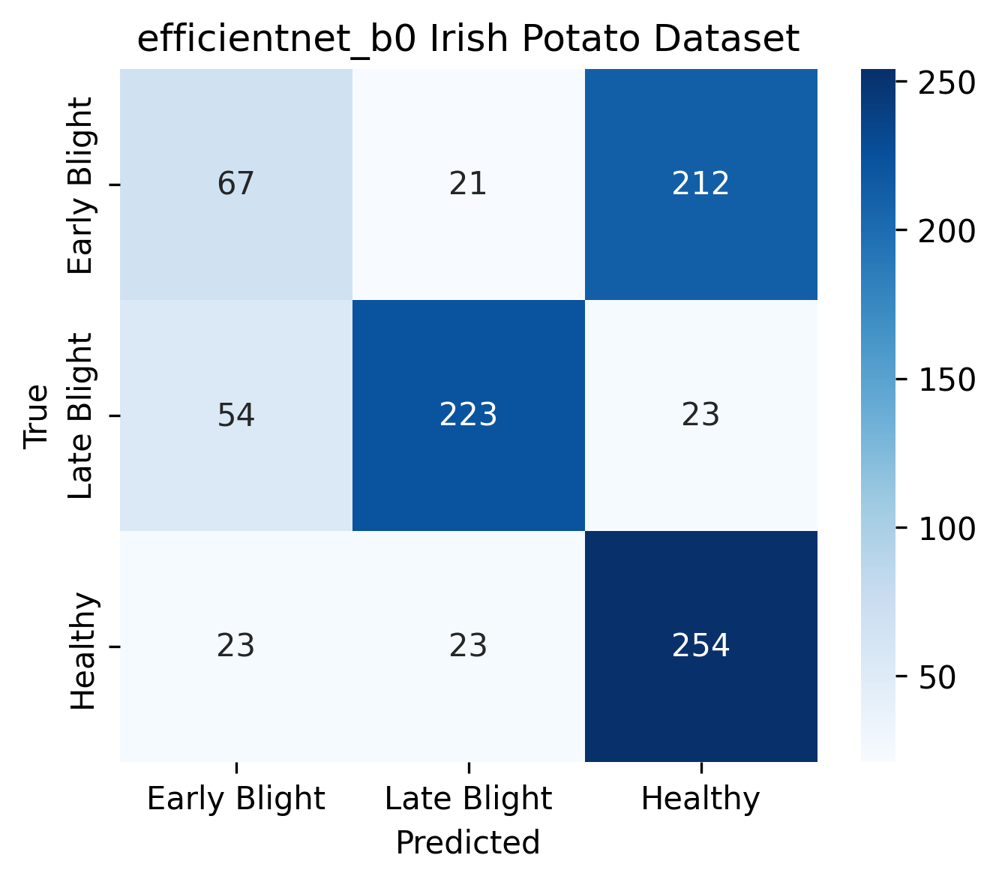

### confusion_matrix_efficientnet_b0_plantdoc_potato_overlap.png

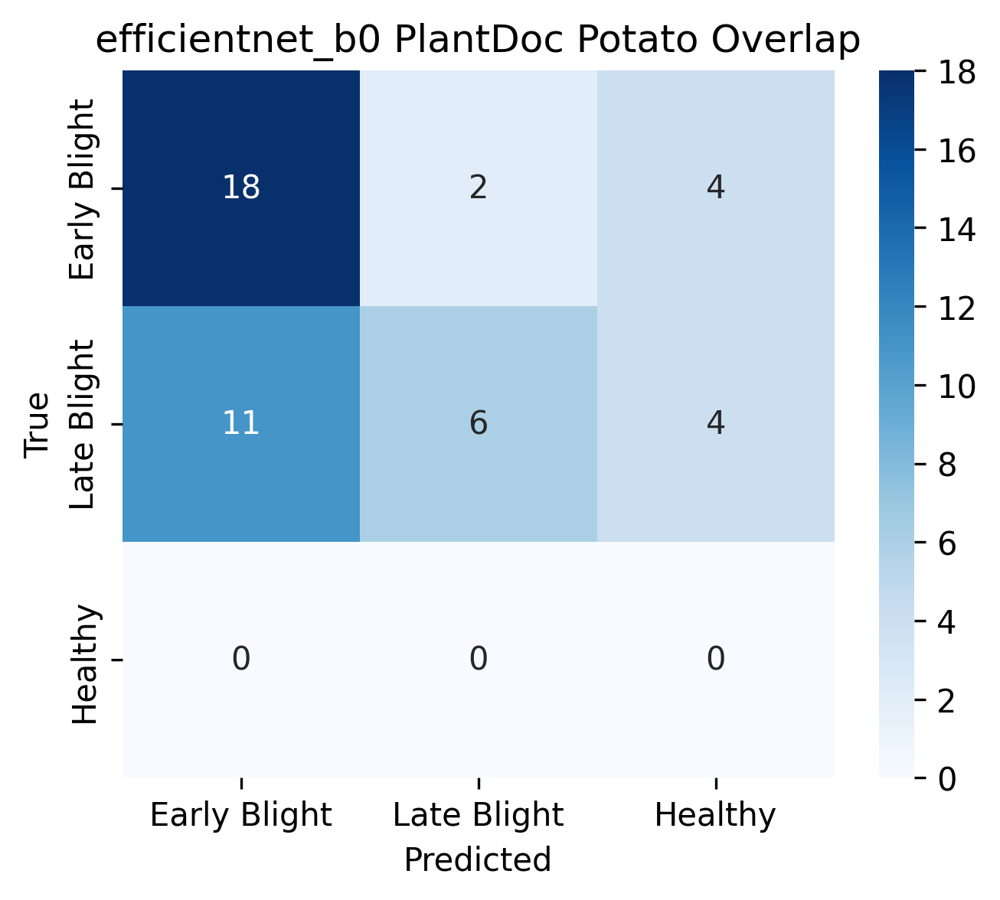

### confusion_matrix_efficientnet_b0_plantvillage_potato.png

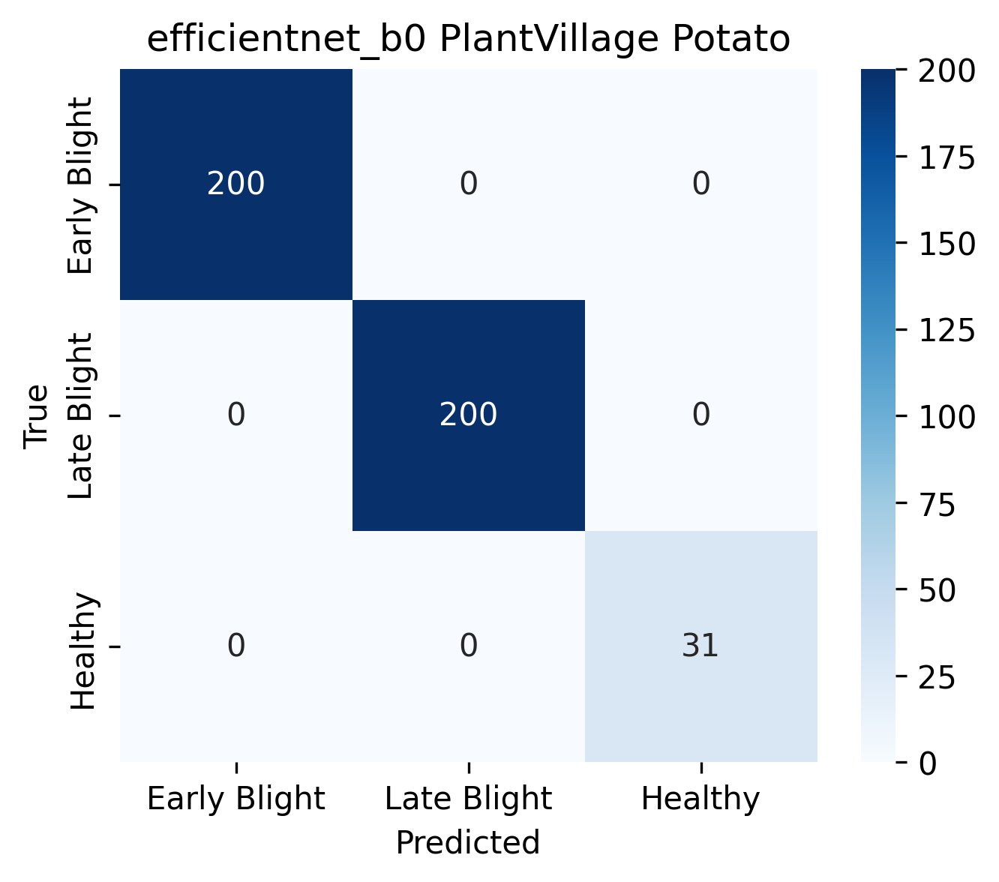

### confusion_matrix_efficientnet_b0_pld_pakistan.png

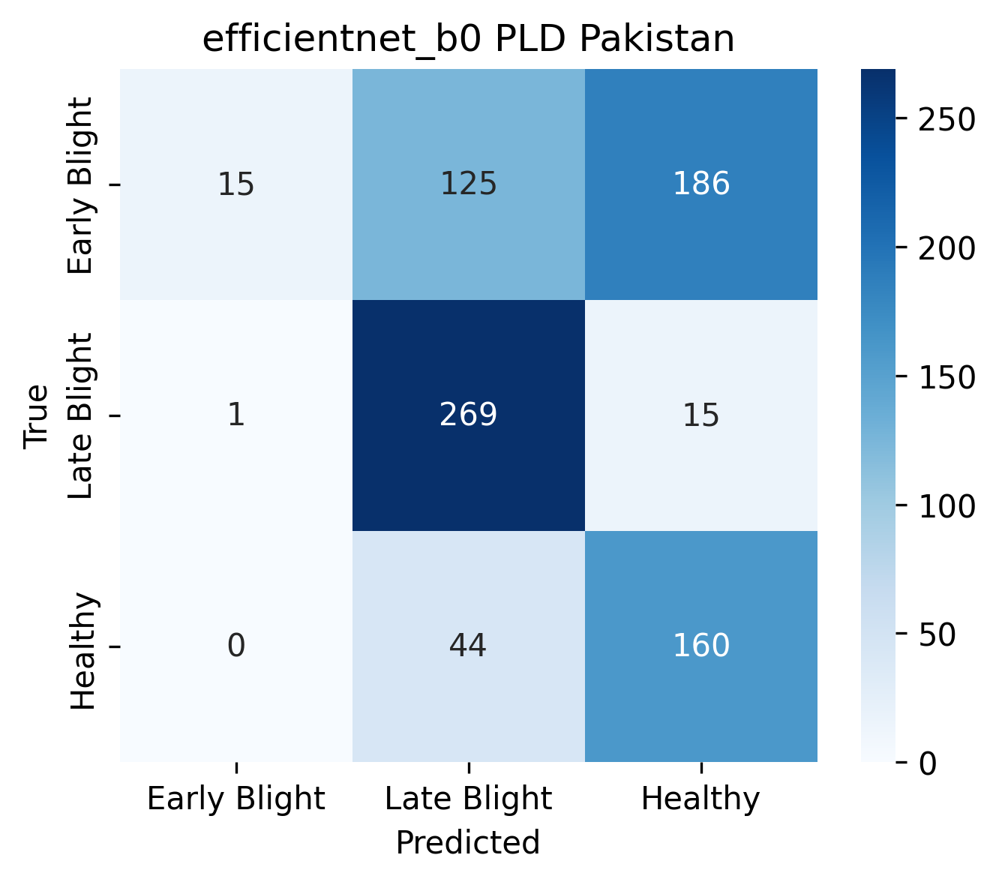

### confusion_matrix_light_cnn_irish_potato_dataset.png

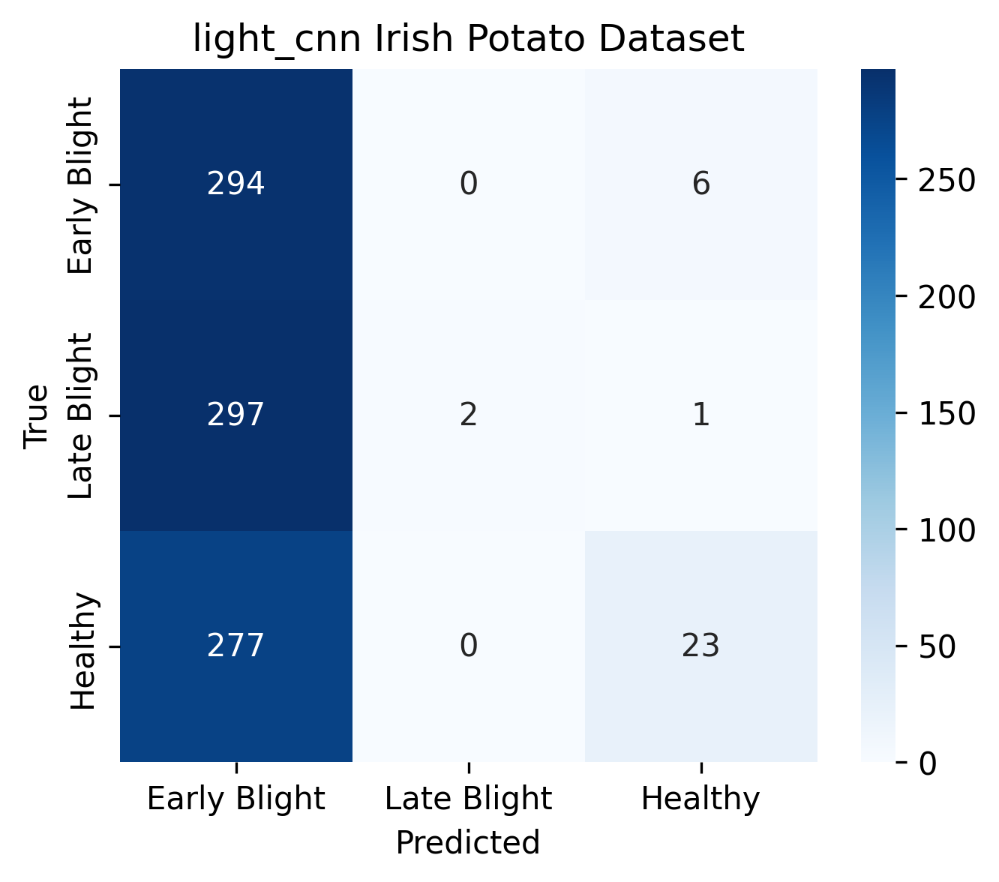

### confusion_matrix_light_cnn_plantdoc_potato_overlap.png

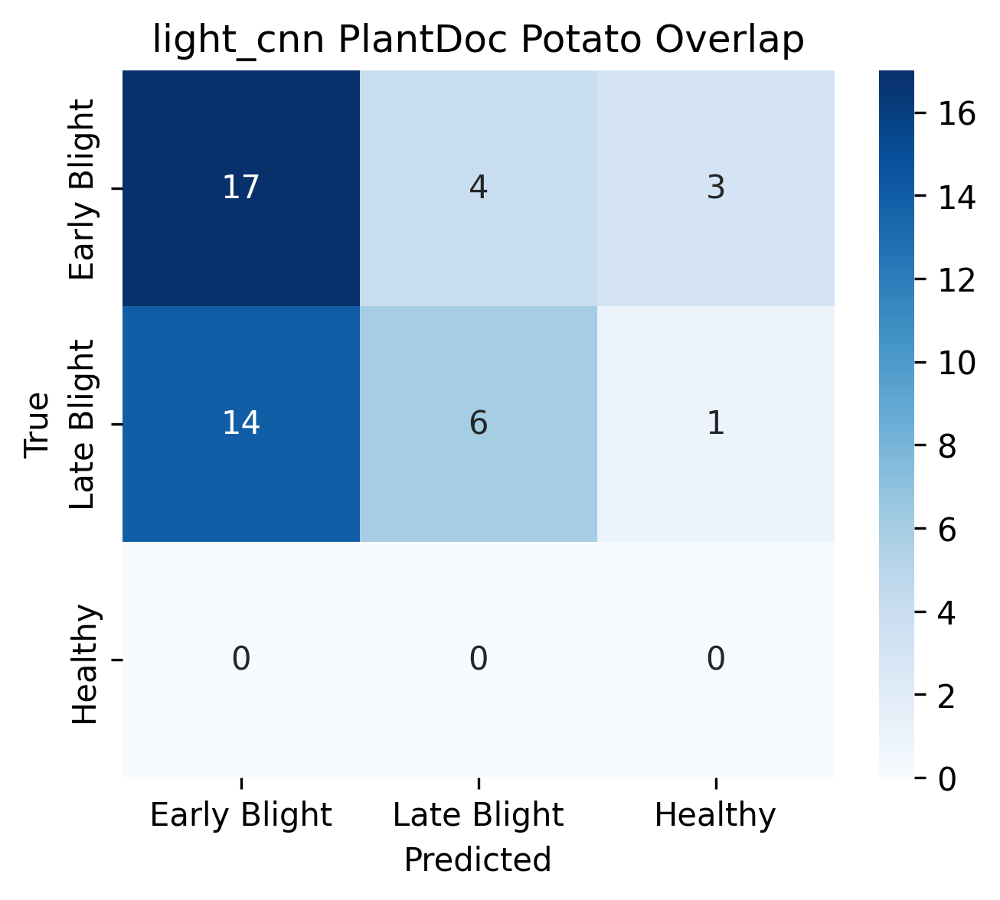

### confusion_matrix_light_cnn_plantvillage_potato.png

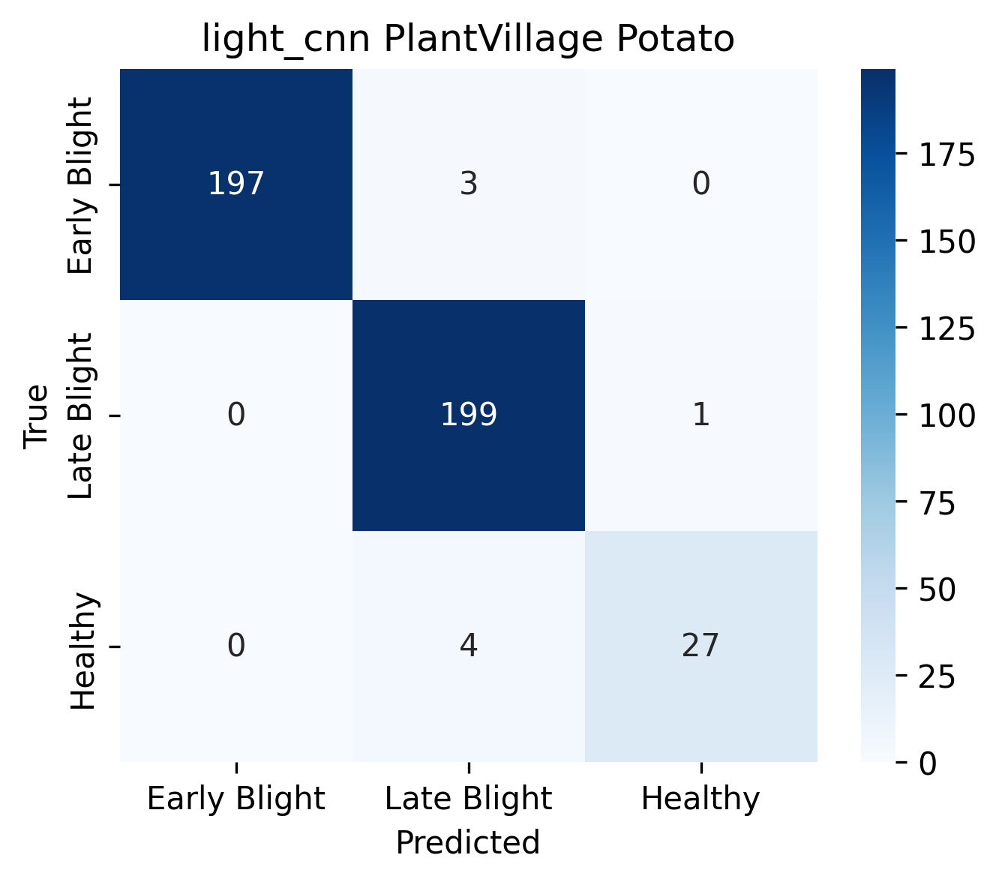

### confusion_matrix_light_cnn_pld_pakistan.png

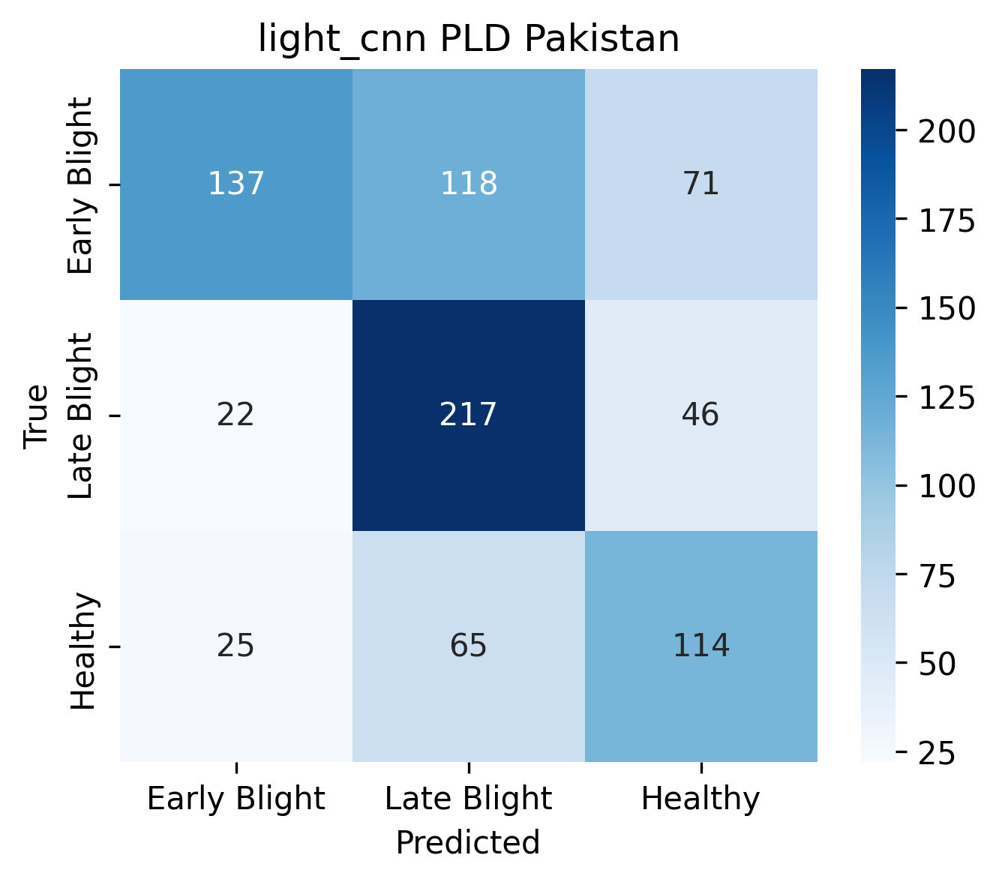

### confusion_matrix_mobilenet_v2_irish_potato_dataset.png

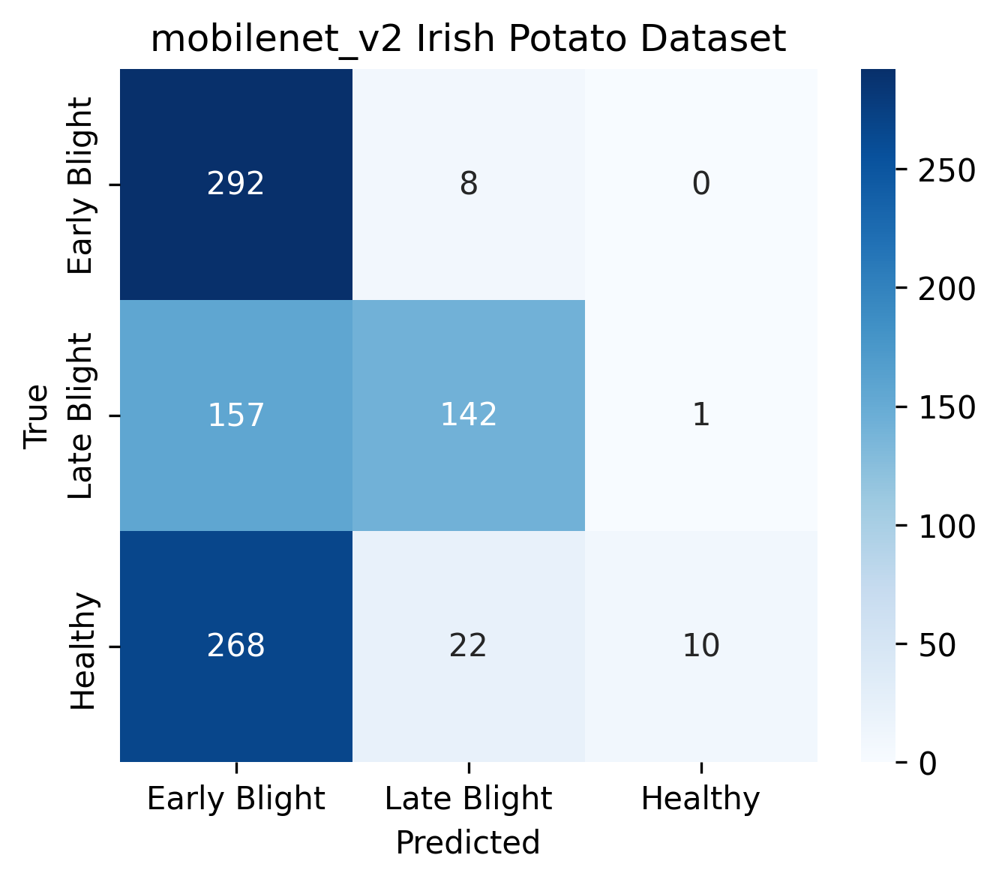

### confusion_matrix_mobilenet_v2_plantdoc_potato_overlap.png

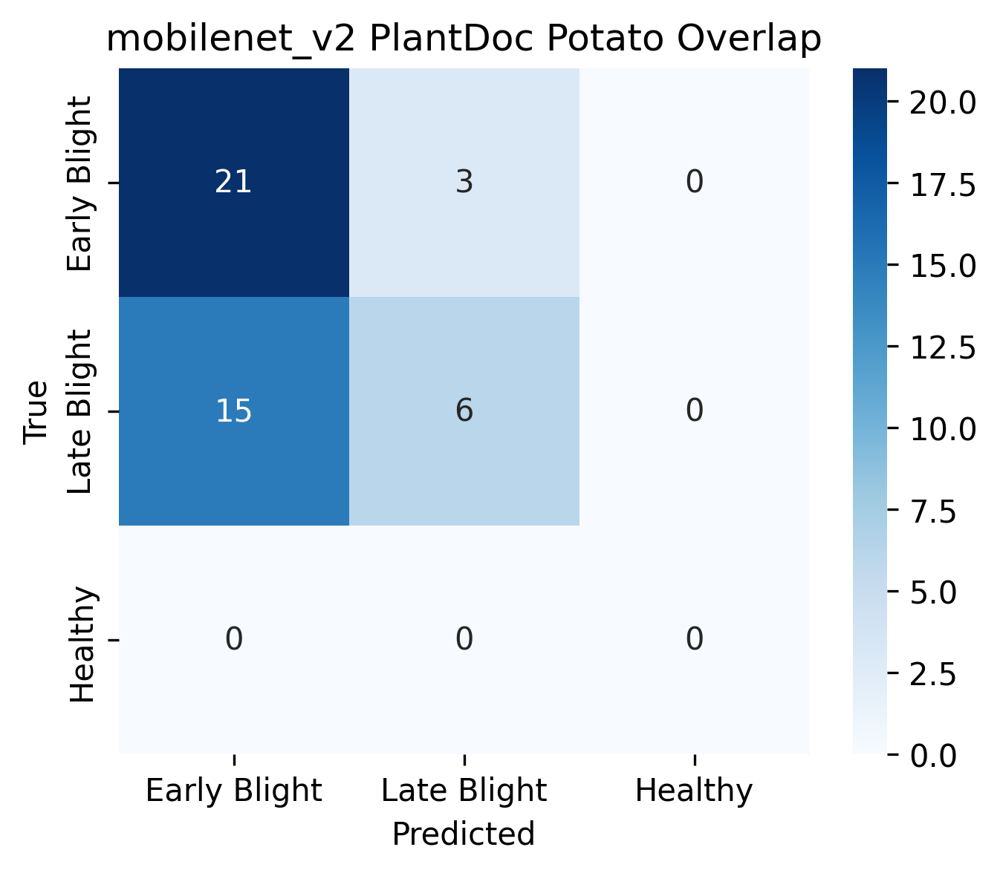

### confusion_matrix_mobilenet_v2_plantvillage_potato.png

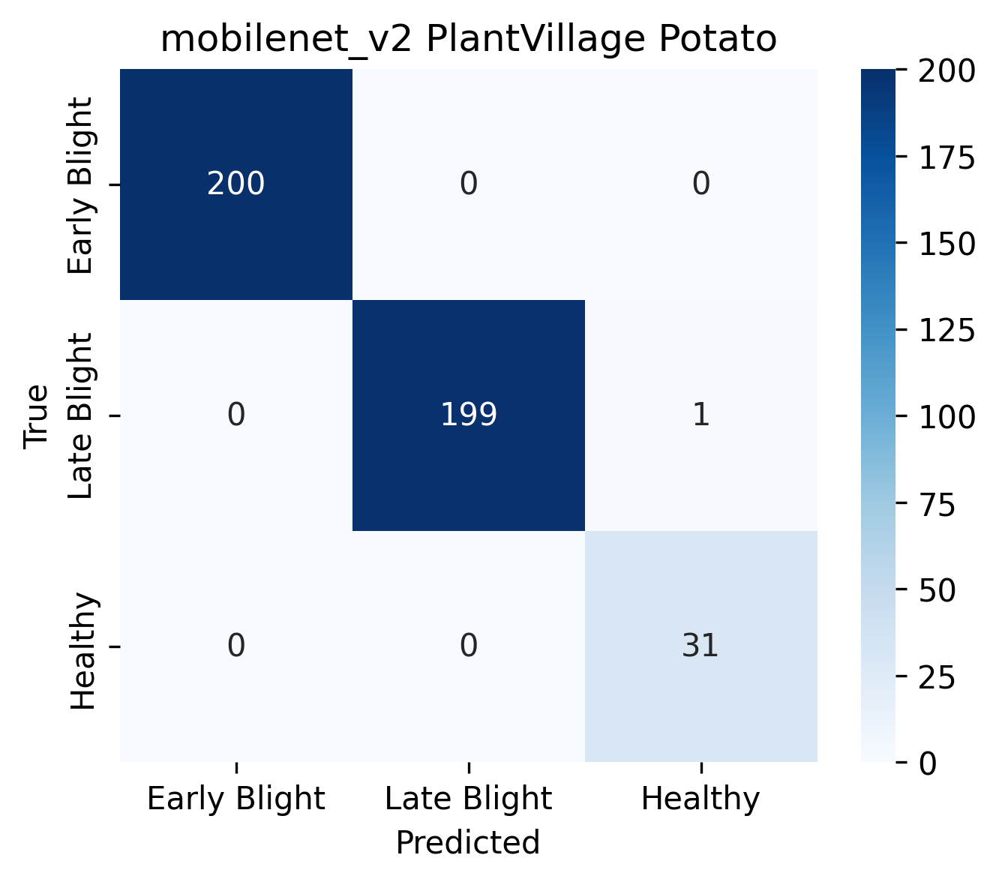

### confusion_matrix_mobilenet_v2_pld_pakistan.png

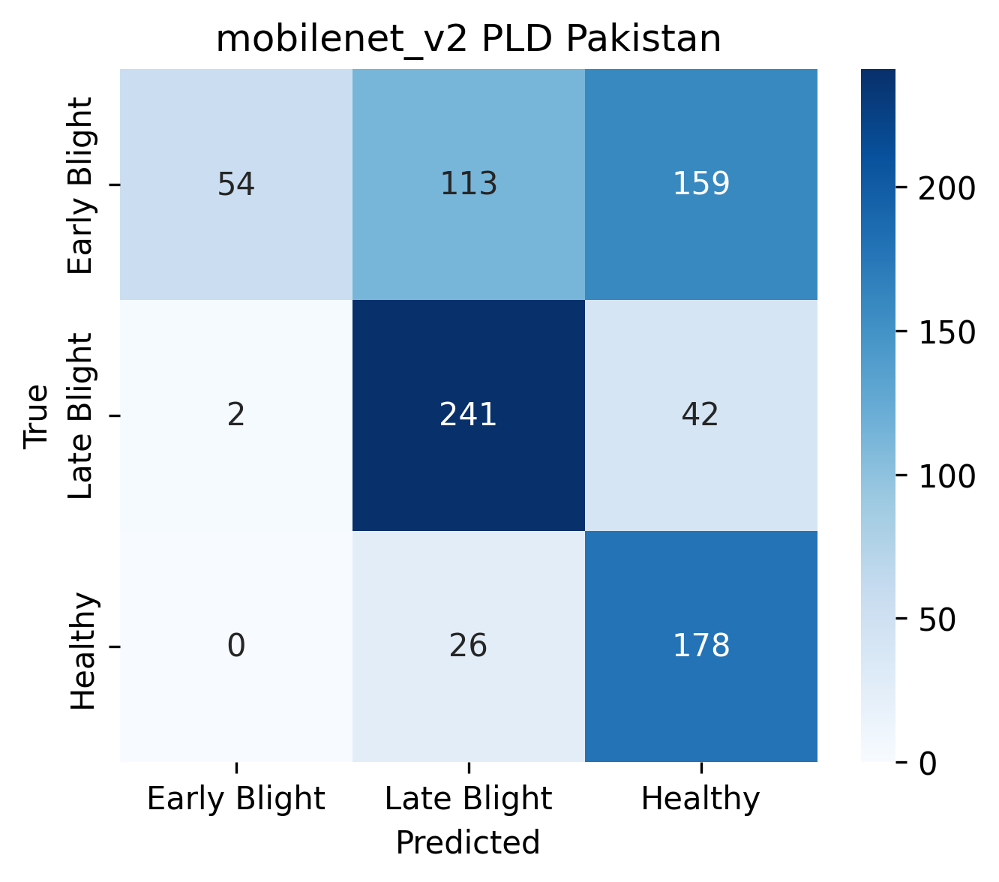

### dataset_domain_shift_examples.png

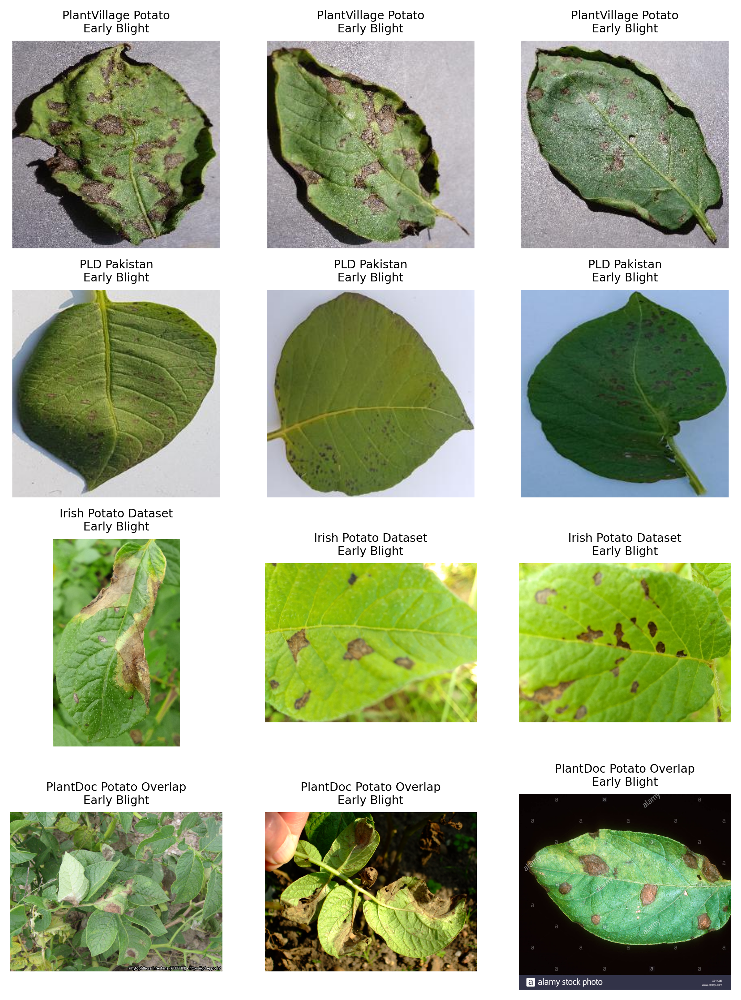

### dbscan_evidence_region_visualization.png

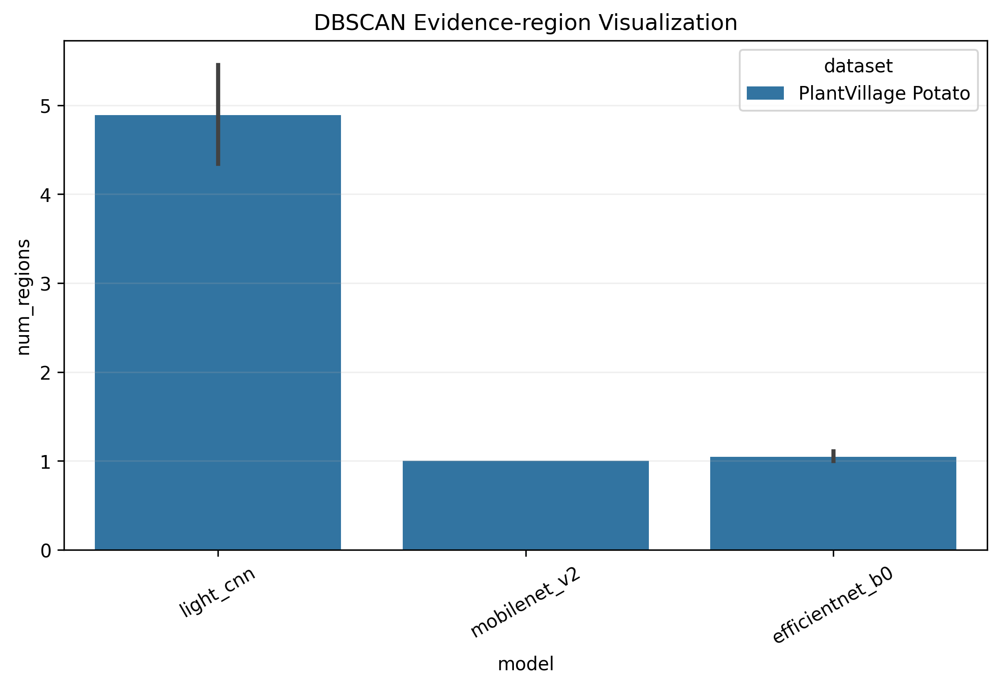

### efficiency_performance_evidence_pareto_plot.png

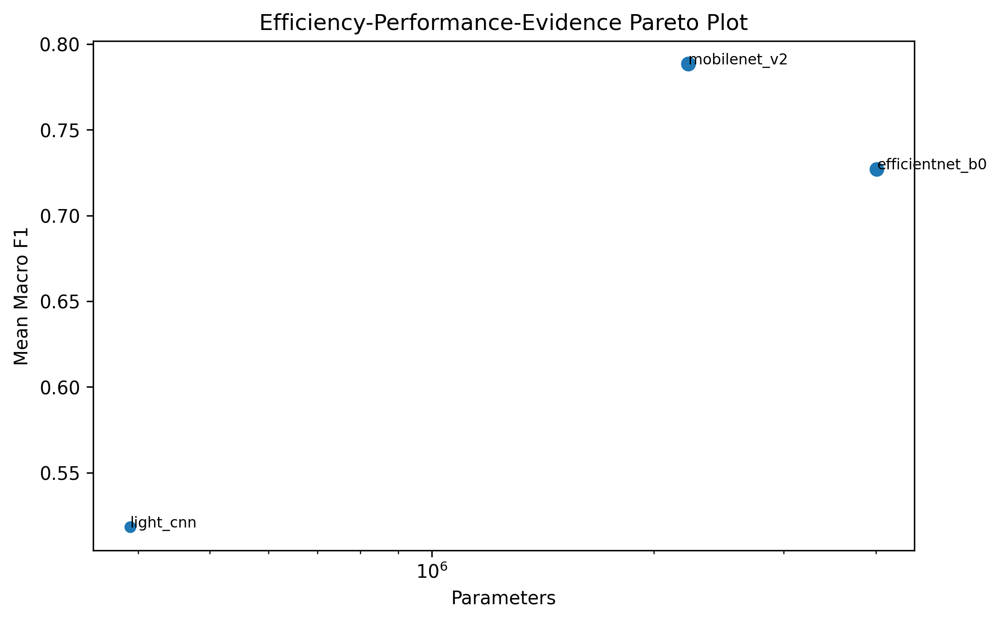

### full_experimental_pipeline.png

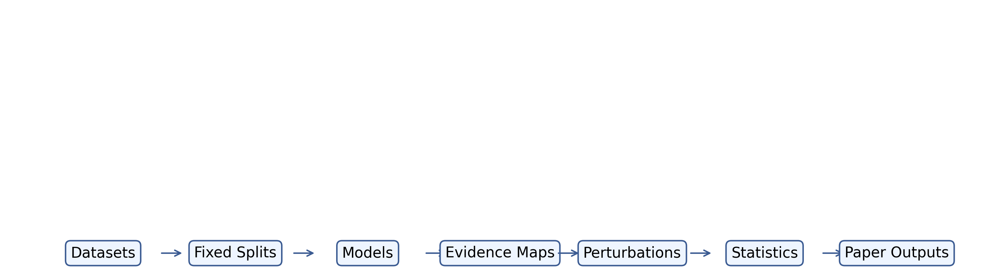

### leaf_only_vs_full_image_vs_background_only_results.png

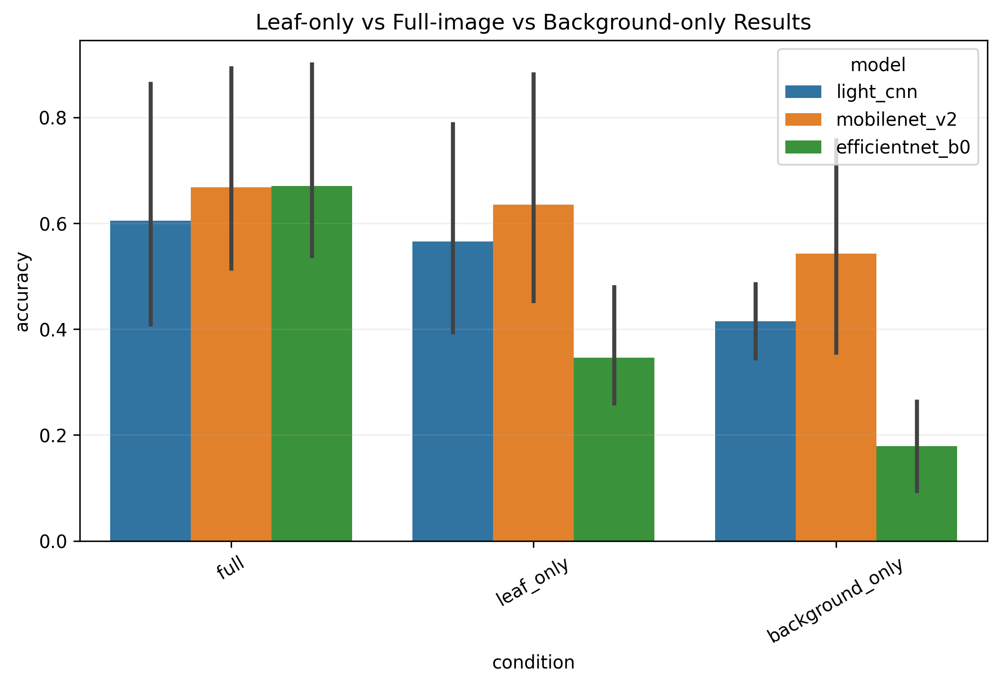

### lesion_focus_ratio.png

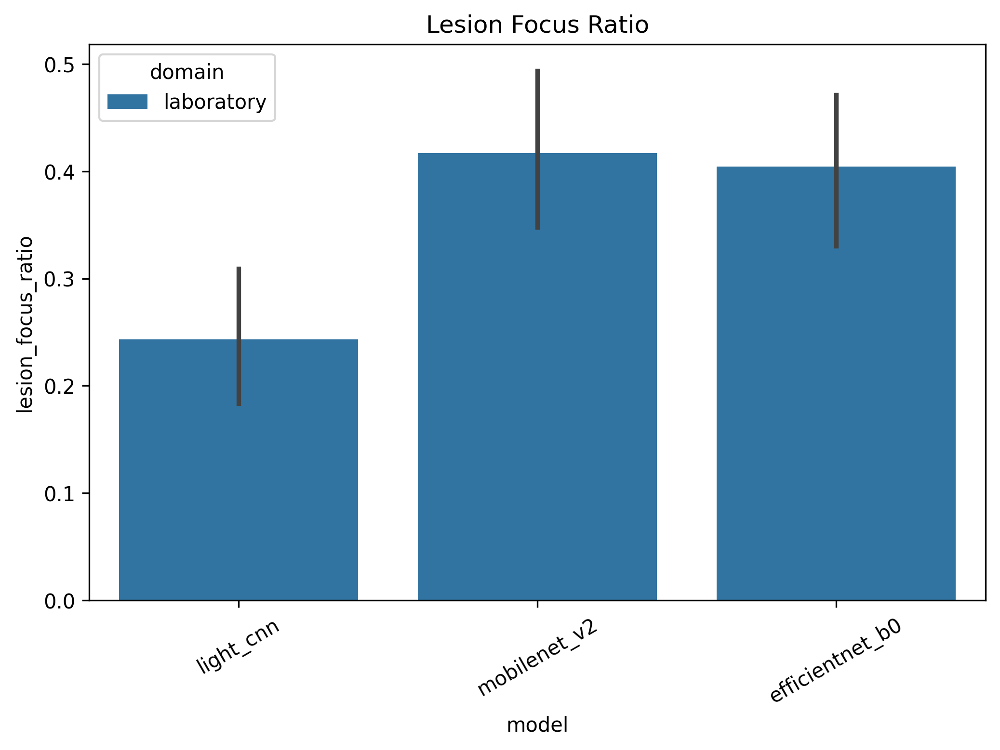

### lesion_occlusion_results.png

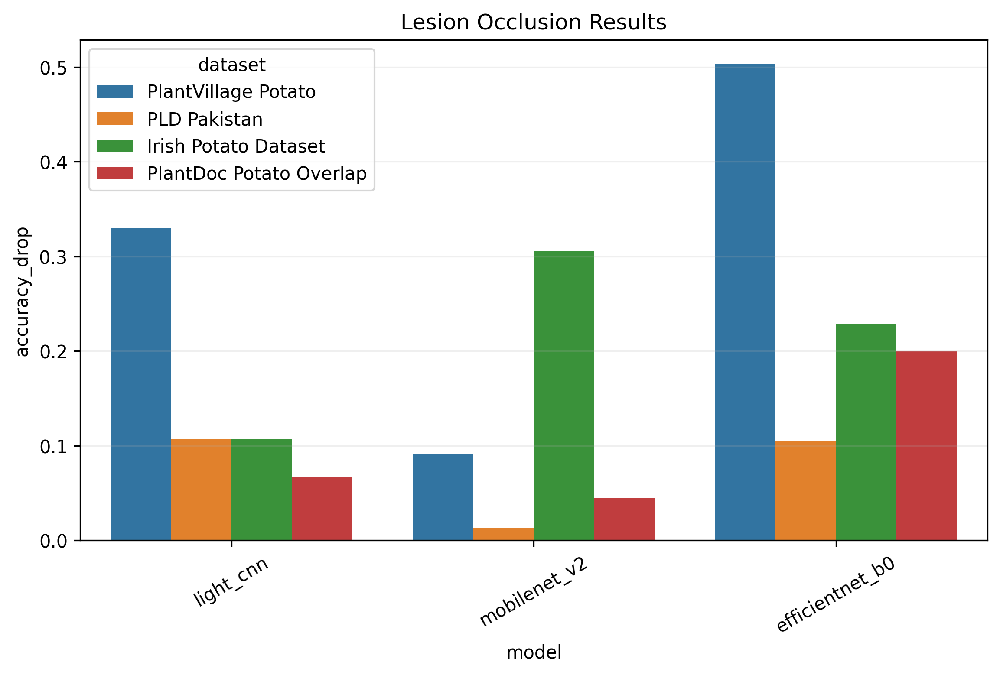

### umap_tsne_feature_plots.png

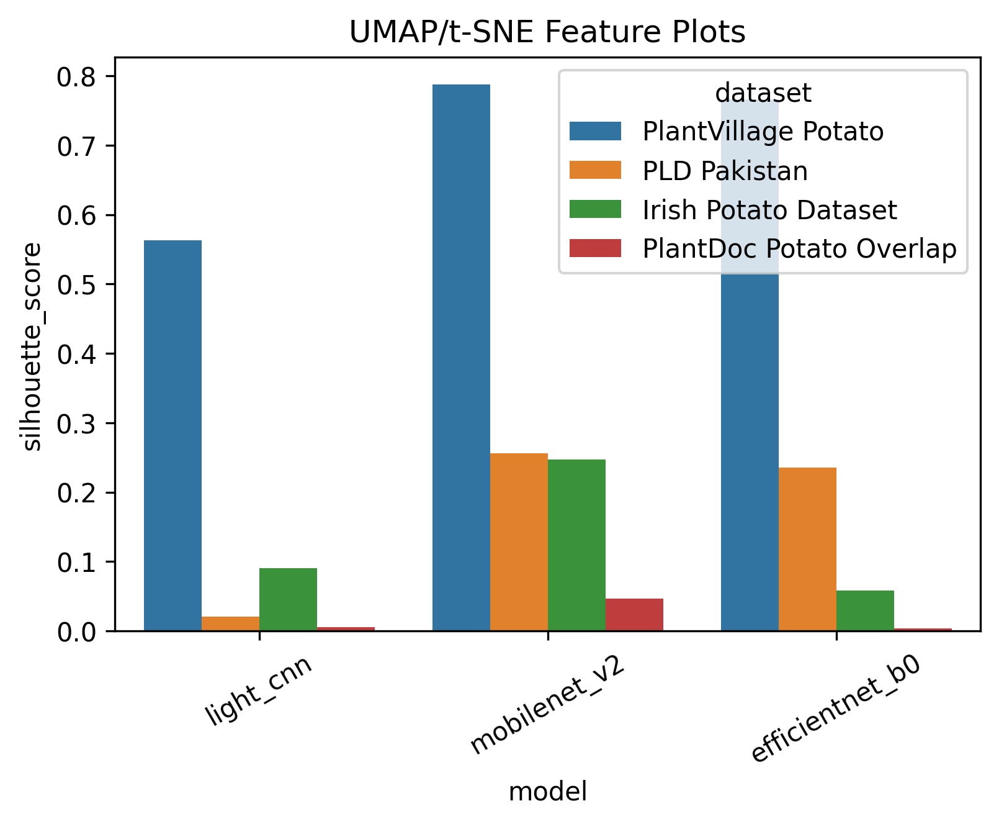

## Output Inventory

all_results.csv : 0.06 MB
attribution_maps/ : 192 files
config.json : 0.00 MB
dbscan_regions/ : 0 files
embeddings/ : 12 files
figures/ : 74 files
logs/ : 0 files
masks/ : 0 files
models/ : 282 files
paper_summary.txt : 0.00 MB
perturbation_images/ : 1000 files
predictions_efficientnet_b0_irish_potato_dataset.csv : 0.20 MB
predictions_efficientnet_b0_plantdoc_potato_overlap.csv : 0.01 MB
predictions_efficientnet_b0_plantvillage_potato.csv : 0.12 MB
predictions_efficientnet_b0_pld_pakistan.csv : 0.19 MB
predictions_light_cnn_irish_potato_dataset.csv : 0.20 MB
predictions_light_cnn_plantdoc_potato_overlap.csv : 0.01 MB
predictions_light_cnn_plantvillage_potato.csv : 0.11 MB
predictions_light_cnn_pld_pakistan.csv : 0.19 MB
predictions_mobilenet_v2_irish_potato_dataset.csv : 0.20 MB
predictions_mobilenet_v2_plantdoc_potato_overlap.csv : 0.01 MB
predictions_mobilenet_v2_plantvillage_potato.csv : 0.12 MB
predictions_mobilenet_v2_pld_pakistan.csv : 0.19 MB
reproducibility/ : 1 files
seed_resu


## Stage 1 Save Checklist

Before leaving this notebook:

1. Confirm the report is visible above.
2. Confirm `stage1_outputs.zip` exists.
3. Download `stage1_outputs.zip`.
4. Click **Save Version** in Kaggle.


In [4]:
from pathlib import Path
from IPython.display import display, Markdown, Image
import pandas as pd

OUTPUT_DIR = Path("/kaggle/working/paper_outputs_stage1")

display(Markdown("# ICMLA Stage 1 Report"))
display(Markdown(f"Output folder: `{OUTPUT_DIR}`"))

# -------------------------
# Paper summary
# -------------------------
summary_path = OUTPUT_DIR / "paper_summary.txt"
display(Markdown("## Paper Summary"))

if summary_path.exists():
    print(summary_path.read_text(encoding="utf-8", errors="ignore"))
else:
    print("paper_summary.txt not found.")

# -------------------------
# Helper
# -------------------------
def show_csv(path, title, rows=25):
    path = Path(path)
    display(Markdown(f"## {title}"))
    if path.exists():
        df = pd.read_csv(path)
        print(f"Rows: {len(df)} | Columns: {len(df.columns)}")
        display(df.head(rows))
        return df
    else:
        print(f"Not found: {path}")
        return None

# -------------------------
# Main result tables
# -------------------------
show_csv(OUTPUT_DIR / "all_results.csv", "All Results", rows=30)
show_csv(OUTPUT_DIR / "seed_results.csv", "Seed Results", rows=30)

show_csv(OUTPUT_DIR / "tables/dataset_summary.csv", "Dataset Summary", rows=20)
show_csv(OUTPUT_DIR / "tables/main_performance_table.csv", "Main Performance Table", rows=30)
show_csv(OUTPUT_DIR / "tables/few_shot_adaptation_table.csv", "Few-Shot Adaptation Table", rows=30)
show_csv(OUTPUT_DIR / "tables/attribution_evidence_table.csv", "Attribution Evidence Table", rows=30)
show_csv(OUTPUT_DIR / "tables/lesion_occlusion_table.csv", "Lesion Occlusion Table", rows=30)
show_csv(OUTPUT_DIR / "tables/background_perturbation_table.csv", "Background Perturbation Table", rows=30)
show_csv(OUTPUT_DIR / "tables/leaf_only_background_only_table.csv", "Leaf / Background Only Table", rows=30)
show_csv(OUTPUT_DIR / "tables/representation_geometry_table.csv", "Representation Geometry Table", rows=30)
show_csv(OUTPUT_DIR / "tables/efficiency_table.csv", "Efficiency Table", rows=20)
show_csv(OUTPUT_DIR / "tables/statistical_significance_table.csv", "Statistical Significance Table", rows=30)
show_csv(OUTPUT_DIR / "tables/class_wise_performance_table.csv", "Class-wise Performance Table", rows=30)
show_csv(OUTPUT_DIR / "tables/dbscan_evidence_region_table.csv", "DBSCAN Evidence Region Table", rows=30)

# -------------------------
# Show figures
# -------------------------
fig_dir = OUTPUT_DIR / "figures"
display(Markdown("## Figures"))

if fig_dir.exists():
    figs = sorted(fig_dir.glob("*.png"))
    print(f"Found {len(figs)} PNG figures.")
    for fig in figs:
        display(Markdown(f"### {fig.name}"))
        display(Image(filename=str(fig)))
else:
    print("Figures folder not found.")

# -------------------------
# Output inventory
# -------------------------
display(Markdown("## Output Inventory"))

for p in sorted(OUTPUT_DIR.iterdir()):
    if p.is_dir():
        n = sum(1 for _ in p.rglob("*") if _.is_file())
        print(f"{p.name}/ : {n} files")
    else:
        print(f"{p.name} : {p.stat().st_size / (1024**2):.2f} MB")

display(Markdown("""
## Stage 1 Save Checklist

Before leaving this notebook:

1. Confirm the report is visible above.
2. Confirm `stage1_outputs.zip` exists.
3. Download `stage1_outputs.zip`.
4. Click **Save Version** in Kaggle.
"""))